<a href="https://colab.research.google.com/github/MInner/lrmf/blob/main/jax_gaussian_and_real_nvp.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Log-Likelihood Ratio Minimizing Flows

Let us consider two univariate normal random variables $A, B$ with moments $\mu_A, \mu_B, \sigma^2_A, \sigma^2_B$, restrict $M$ to normal densities, and the transform $T(x; \phi)$ to the affine family: $T(x; a, b) = ax + b$, i.e. $\theta = (\mu, \sigma)$ and $\phi = (a, b)$. 

In the main paper we show that minimizing the LRMF loss in this case is eqvivalent to moment matching.

In [ ]:
import jax
import jax.numpy as np

def norm_logp(data, theta):
  mu, sigma = theta
  logp = jax.scipy.stats.norm.logpdf(data, mu, sigma)
  return np.sum(logp)

def norm_gen_norm_prior(z, theta):
  mu, sigma = theta
  return z * sigma + mu

def norm_prior_sample(rng, n):
  return jax.random.normal(rng, (n,))

def norm_prior_logp(data):
  return np.sum(jax.scipy.stats.norm.logpdf(data))

def normal_fit_fn(data):
  return np.mean(data), np.std(data)


def build_translation_objective(data_a, data_b, fit_fn, logp, gen, prior_sample, 
                                prior_logp, sample_ent_est_n=100, 
                                sample_trainint_gen_n=100):
  
  theta_a = fit_fn(data_a)
  theta_b = fit_fn(data_b)
  z_ent = prior_sample(jax.random.PRNGKey(0), sample_ent_est_n)
  ent_a = logp(data_a, theta_a)
  ent_b = logp(data_b, theta_b)
  def min_objective(params, rng):
    theta_ab, theta_t = params
    z = prior_sample(rng, sample_trainint_gen_n)
    gen_b = gen(z, theta_b)
    gen_t = gen(gen_b, theta_t)
    llk = (logp(data_a, theta_ab) + logp(gen_t, theta_ab) 
           - logp(gen_t, theta_t) + prior_logp(gen_b)
           - ent_b - ent_a)
    
    return -1 * llk
    
  return theta_a, theta_b, min_objective

drng_a, drng_b = jax.random.split(jax.random.PRNGKey(1))
data_a = norm_gen_norm_prior(norm_prior_sample(drng_a, 100), (2.0, 3.0))
data_b = norm_gen_norm_prior(norm_prior_sample(drng_b, 100), (-4.0, 1.0))
theta_a, theta_b, loss = build_translation_objective(
    data_a, data_b, normal_fit_fn, norm_logp, norm_gen_norm_prior, 
    norm_prior_sample, norm_prior_logp)

In [ ]:
print(loss(((0.0, 1.0), (0.0, 1.0)), jax.random.PRNGKey(0)))
print(loss(((2.0, 3.0), (14.0, 3.0)), jax.random.PRNGKey(0)))

1181.7675
-1.1879272


In [ ]:
import matplotlib.pyplot as plt
from jax.experimental import optimizers

def plot_theta(theta, color):
  mu, sigma = theta
  xs = np.linspace(mu - 3*sigma, mu + 3*sigma, 100)
  plt.plot(xs, jax.scipy.stats.norm.pdf(xs, mu, sigma), c=color)

def plot_data(data, color, shift=0.0):
  plt.scatter(data, np.zeros_like(data) - shift, marker='|', c=color, alpha=0.3)

0 1181.7675
[[-0.00148764  1.0255036 ]
 [ 0.00383262  0.98541874]]


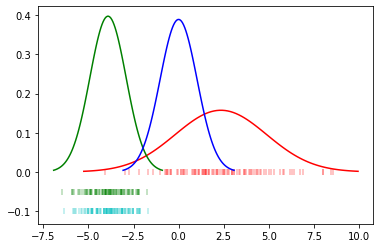

1000 97.207245
[[0.3144117 2.7339125]
 [2.7404745 1.0251707]]


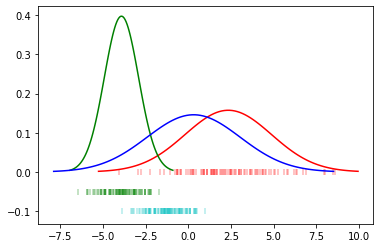

2000 60.390076
[[1.0657742 2.2962737]
 [4.6304526 1.1344721]]


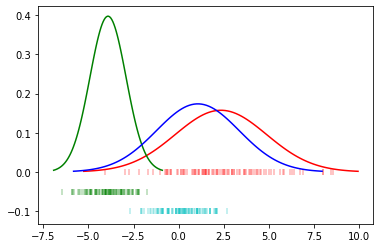

3000 28.653687
[[1.6347438 2.109957 ]
 [6.078176  1.276136 ]]


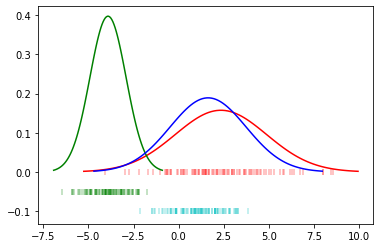

4000 17.13263
[[1.8777586 2.104369 ]
 [7.1320677 1.438666 ]]


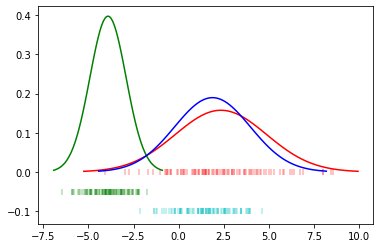

5000 10.357025
[[1.9962962 2.1354077]
 [7.9130225 1.602441 ]]


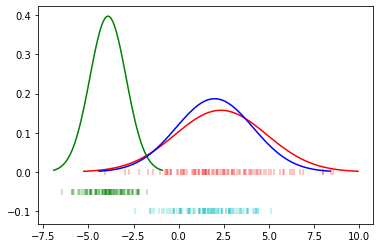

6000 2.0007935
[[2.065725  2.176296 ]
 [8.518226  1.7186229]]


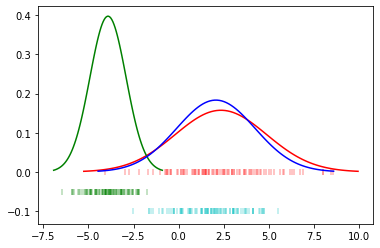

7000 10.801331
[[2.113008  2.2132077]
 [8.999078  1.8112983]]


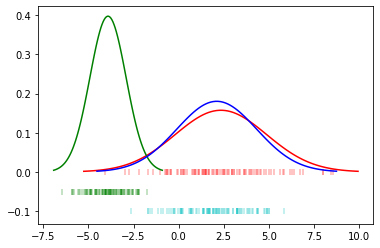

8000 0.19543457
[[2.144382  2.2435043]
 [9.398601  1.8849568]]


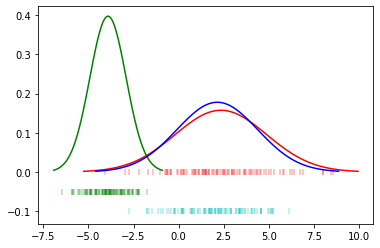

9000 -0.101867676
[[2.1763015 2.278793 ]
 [9.725646  1.9672947]]


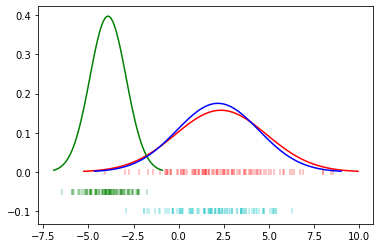

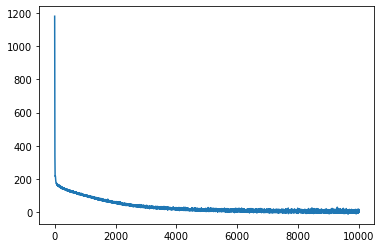

In [ ]:
opt_init, opt_update, get_params = optimizers.momentum(step_size=1e-5, mass=0.9)

@jax.jit
def step(i, opt_state, rng):
  params = get_params(opt_state)
  val, g = jax.value_and_grad(loss)(params, rng)
  return val, opt_update(i, g, opt_state)

init_thetas = np.array([(0.0, 1.0), (0.0, 1.0)])
opt_state = opt_init(init_thetas)

losses = []

for i in range(10000):
  rng = jax.random.PRNGKey(i)
  loss_value, opt_state = step(i, opt_state, rng)
  losses.append(loss_value)
  cur_theta = get_params(opt_state)
  if i % 1000 == 0:
    print(i, loss_value)
    print(cur_theta)
    theta_ab, theta_t = cur_theta
    plot_theta(theta_a, 'r')
    plot_data(data_a, 'r')
    plot_theta(theta_b, 'g')
    plot_data(data_b, 'g', 0.05)
    plot_theta(theta_ab, 'b')
    transformed_b = norm_gen_norm_prior(data_b, theta_t)
    plot_data(transformed_b, 'c', 0.1)
    plt.show()

plt.plot(losses)
plt.show()

Now the same objective with 2D Gaussian.

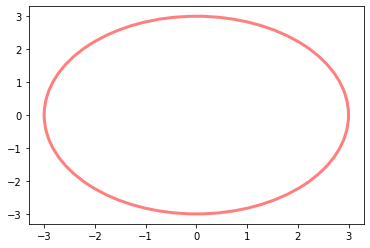

In [ ]:
from matplotlib.patches import Ellipse
import matplotlib.transforms as transforms

def confidence_ellipse(mean, cov, color, ax=None, n_std=3.0, **kwargs):
    ax = ax or plt.gca()

    draw_kwargs = dict(lw=3, alpha=0.5, edgecolor=color, facecolor='none')
    draw_kwargs.update(kwargs)

    mean_x, mean_y = mean
    pearson = cov[0, 1]/np.sqrt(cov[0, 0] * cov[1, 1])
    scale_x = np.sqrt(cov[0, 0]) * n_std
    scale_y = np.sqrt(cov[1, 1]) * n_std

    ell_radius_x = np.sqrt(1 + pearson)
    ell_radius_y = np.sqrt(1 - pearson)
    ellipse = Ellipse((0, 0),
        width=ell_radius_x * 2,
        height=ell_radius_y * 2,
        **draw_kwargs)


    transf = transforms.Affine2D() \
        .rotate_deg(45) \
        .scale(scale_x, scale_y) \
        .translate(mean_x, mean_y)

    ellipse.set_transform(transf + ax.transData)
    draw = ax.add_patch(ellipse)
    ax.autoscale_view()
    return draw

confidence_ellipse(np.zeros(2), np.eye(2), 'red')
plt.show()

In [ ]:
def mult_norm_logp(data, theta):
  mu, l_sqrt = theta
  sigma = l_sqrt.T @ l_sqrt
  logp = jax.scipy.stats.multivariate_normal.logpdf(data, mu, sigma)
  return np.mean(logp)

def mult_norm_gen_norm_prior(z, theta):
  mu, l_sqrt = theta
  return z @ l_sqrt + mu

def build_mult_norm_prior_sample(dim):
  return lambda rng, n: jax.random.normal(rng, (n, dim))

def mult_norm_prior_logp(data):
  dim = data.shape[1]
  mean = np.zeros(dim)
  cov = np.eye(dim)
  return np.mean(jax.scipy.stats.multivariate_normal.logpdf(data, mean, cov))

def mult_normal_fit_fn(data):
  cov = np.cov(data, rowvar=False)
  lsqrt = np.linalg.cholesky(cov)
  mu = np.mean(data, axis=0)
  return mu, lsqrt

def plot_theta(theta, color):
  mu, l_sqrt = theta
  cov = l_sqrt.T @ l_sqrt
  confidence_ellipse(mu, cov, color)

def plot_data(data, color):
  plt.scatter(*data.T, marker='x', c=color, alpha=0.7)

drng_a, drng_b = jax.random.split(jax.random.PRNGKey(1))
mult_norm_prior_sample_2d = build_mult_norm_prior_sample(dim=2)

theta_a_gt = np.array([1.0, 1.0]), np.array([[0.5, 0.7], [-0.5, 0.3]])
theta_t_gt = np.array([4.0, -2.0]), np.array([[0.5, 3.0], [3.0, -2.0]])
data_a = mult_norm_gen_norm_prior(mult_norm_prior_sample_2d(drng_a, 100), theta_a_gt)
data_a_for_t = mult_norm_gen_norm_prior(mult_norm_prior_sample_2d(drng_b, 100), theta_a_gt)
data_b = mult_norm_gen_norm_prior(data_a_for_t, theta_t_gt)


theta_a, theta_b, loss = build_translation_objective(
    data_a, data_b, mult_normal_fit_fn, mult_norm_logp, mult_norm_gen_norm_prior, 
    mult_norm_prior_sample_2d, mult_norm_prior_logp)

In [ ]:
print(theta_a[0])
print(theta_a[1].T @ theta_a[1])
print(theta_a_gt[1].T @ theta_a_gt[1])

[0.9876334 1.0204873]
[[0.73044455 0.26210773]
 [0.26210773 0.5583434 ]]
[[0.5        0.19999999]
 [0.19999999 0.58      ]]


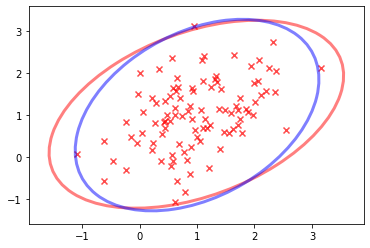

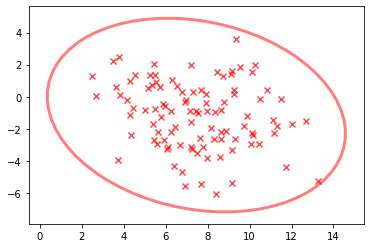

In [ ]:
plot_data(data_a, 'red')
plot_theta(theta_a, 'red')
plot_theta(theta_a_gt, 'blue')
plt.show()

plot_data(data_b, 'red')
plot_theta(theta_b, 'red')
plt.show()

In [ ]:
print(loss((theta_a_gt, theta_t_gt), jax.random.PRNGKey(0)))

535.6663


In [ ]:
# skip this cell if you want blob experiments

def get_moons_pair(n_samples=2000):
  from sklearn import datasets
  from sklearn.preprocessing import StandardScaler
  X, y = datasets.make_moons(n_samples=n_samples, noise=.05)
  data_a = StandardScaler().fit_transform(X)
  theta = np.radians(50)
  c, s = np.cos(theta), np.sin(theta)
  R = np.array(((c,-s), (s, c)))
  data_b = data_a @ R
  return data_a, data_b

data_a, data_b = get_moons_pair(n_samples=1000)

theta_a, theta_b, loss = build_translation_objective(
    data_a, data_b, mult_normal_fit_fn, mult_norm_logp, mult_norm_gen_norm_prior, 
    mult_norm_prior_sample_2d, mult_norm_prior_logp)

0 0.36111546
((DeviceArray([0.00100002, 0.00100002], dtype=float32), DeviceArray([[ 9.9899995e-01, -1.0000231e-03],
             [-1.0000231e-03,  1.0010000e+00]], dtype=float32)), (DeviceArray([-0.00100002, -0.00100002], dtype=float32), DeviceArray([[ 1.0010000e+00, -1.0000231e-03],
             [-1.0000231e-03,  9.9899995e-01]], dtype=float32)))


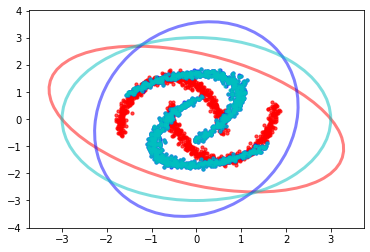

1000 -0.06337452
((DeviceArray([0.0024053 , 0.00868204], dtype=float32), DeviceArray([[ 0.96261066, -0.21445549],
             [-0.24130492,  0.97701585]], dtype=float32)), (DeviceArray([ 0.00182273, -0.01008134], dtype=float32), DeviceArray([[ 1.266593  , -0.23520635],
             [-0.33037668,  0.83072793]], dtype=float32)))


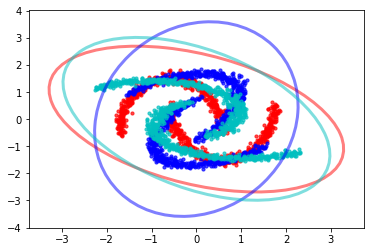

2000 0.14227629
((DeviceArray([0.00478012, 0.00382043], dtype=float32), DeviceArray([[ 0.96513385, -0.2166964 ],
             [-0.2435525 ,  0.97845614]], dtype=float32)), (DeviceArray([-0.00135514, -0.00776354], dtype=float32), DeviceArray([[ 1.2893066 , -0.23738201],
             [-0.34267938,  0.8399488 ]], dtype=float32)))


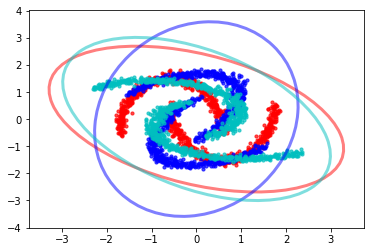

3000 -0.018205166
((DeviceArray([ 0.0031957 , -0.00704101], dtype=float32), DeviceArray([[ 0.96064585, -0.21742792],
             [-0.24331015,  0.97579676]], dtype=float32)), (DeviceArray([-0.00932999,  0.00193817], dtype=float32), DeviceArray([[ 1.2868257 , -0.2366625 ],
             [-0.34060898,  0.846578  ]], dtype=float32)))


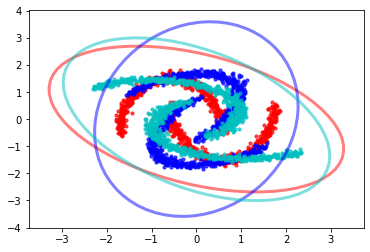

4000 -0.08529186
((DeviceArray([-0.00061375,  0.00794526], dtype=float32), DeviceArray([[ 0.969509  , -0.21740872],
             [-0.24358688,  0.98493326]], dtype=float32)), (DeviceArray([ 0.00080591, -0.00556497], dtype=float32), DeviceArray([[ 1.2849008 , -0.23844229],
             [-0.34133443,  0.8396138 ]], dtype=float32)))


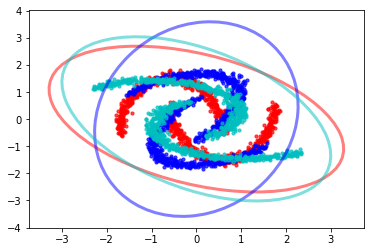

5000 0.02405262
((DeviceArray([-0.00029153,  0.000776  ], dtype=float32), DeviceArray([[ 0.97601336, -0.21504132],
             [-0.24648996,  0.9736427 ]], dtype=float32)), (DeviceArray([0.00075978, 0.00066848], dtype=float32), DeviceArray([[ 1.2716603 , -0.23677948],
             [-0.33429623,  0.84570646]], dtype=float32)))


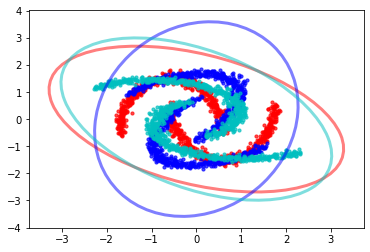

6000 0.28047943
((DeviceArray([-0.00348291, -0.00231095], dtype=float32), DeviceArray([[ 0.9701334 , -0.21289341],
             [-0.2414948 ,  0.97677296]], dtype=float32)), (DeviceArray([0.0109643 , 0.00100441], dtype=float32), DeviceArray([[ 1.2797039 , -0.23984092],
             [-0.34001926,  0.83993137]], dtype=float32)))


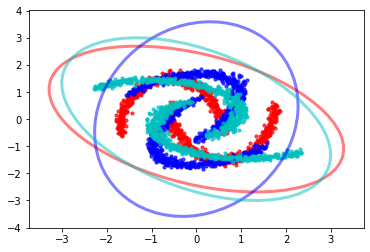

7000 -0.010560989
((DeviceArray([ 0.0048821 , -0.00038189], dtype=float32), DeviceArray([[ 0.964113  , -0.22152716],
             [-0.24764751,  0.9784296 ]], dtype=float32)), (DeviceArray([-0.00504154,  0.00240508], dtype=float32), DeviceArray([[ 1.2899857 , -0.23643295],
             [-0.34042507,  0.844112  ]], dtype=float32)))


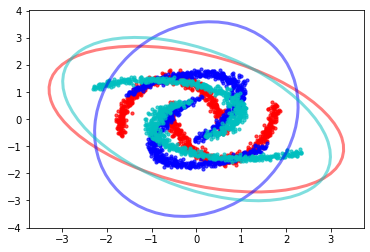

8000 -0.085803986
((DeviceArray([0.00023942, 0.0061589 ], dtype=float32), DeviceArray([[ 0.96423   , -0.21901947],
             [-0.24541669,  0.97758377]], dtype=float32)), (DeviceArray([ 0.00155611, -0.00614344], dtype=float32), DeviceArray([[ 1.2879797 , -0.23898432],
             [-0.34243575,  0.8415321 ]], dtype=float32)))


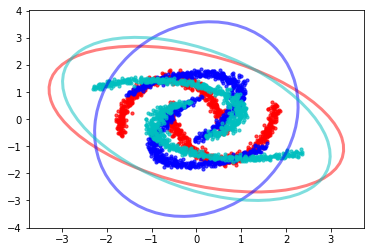

9000 -0.11110115
((DeviceArray([-0.00125457,  0.00201112], dtype=float32), DeviceArray([[ 0.9701662 , -0.21354006],
             [-0.2421223 ,  0.97587353]], dtype=float32)), (DeviceArray([-0.00016543,  0.0040364 ], dtype=float32), DeviceArray([[ 1.2774037 , -0.24502969],
             [-0.34651592,  0.84810346]], dtype=float32)))


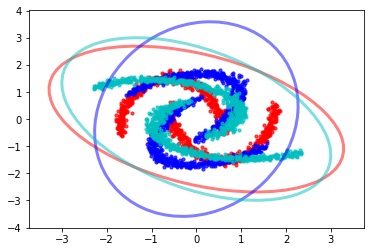

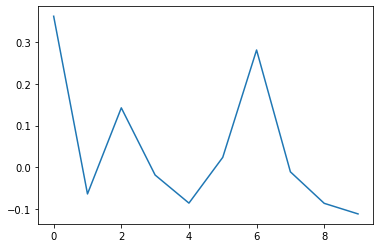

In [ ]:
from jax.experimental import optimizers

opt_init, opt_update, get_params = optimizers.adam(step_size=1e-3)

@jax.jit
def step(i, opt_state, rng):
  params = get_params(opt_state)
  val, g = jax.value_and_grad(loss)(params, rng)
  return val, opt_update(i, g, opt_state)

init_thetas = ((np.zeros(2), np.eye(2)), (np.zeros(2), np.eye(2)))
opt_state = opt_init(init_thetas)

losses = []

def plot_data(data, color):
  plt.scatter(*data.T, s=10, c=color, alpha=0.7)

for i in range(10000):
  rng = jax.random.PRNGKey(i)
  loss_value, opt_state = step(i, opt_state, rng)
  cur_theta = get_params(opt_state)
  if i % 1000 == 0:
    losses.append(loss_value)
    print(i, loss_value)
    print(cur_theta)
    theta_ab, theta_t = cur_theta
    plot_theta(theta_a, 'r')
    plot_data(data_a, 'r')
    plot_theta(theta_b, 'b')
    plot_data(data_b, 'b')
    # plot_theta(theta_ab, 'b')
    transformed_b = mult_norm_gen_norm_prior(data_b, theta_t)
    transformed_t = mult_normal_fit_fn(transformed_b)
    plot_data(transformed_b, 'c')
    plot_theta(theta_ab, 'c')
    plt.show()

plt.plot(losses)
plt.show()

Now the same objective with Real NVP density class.

In [ ]:
# adapted from
# https://blog.evjang.com/2019/07/

import jax.numpy as np
from jax import random
import jax
from jax.experimental import stax
from jax.experimental.stax import Dense, Relu

def nvp_forward(net_params, shift_and_log_scale_fn, x, flip=False):
  d = x.shape[-1]//2
  x1, x2 = x[:, :d], x[:, d:]
  if flip:
    x2, x1 = x1, x2
  shift, log_scale = shift_and_log_scale_fn(net_params, x1)
  y2 = x2*np.exp(log_scale) + shift
  if flip:
    x1, y2 = y2, x1
  y = np.concatenate([x1, y2], axis=-1)
  return y

def nvp_inverse(net_params, shift_and_log_scale_fn, y, flip=False):
  d = y.shape[-1]//2
  y1, y2 = y[:, :d], y[:, d:]
  if flip:
    y1, y2 = y2, y1
  shift, log_scale = shift_and_log_scale_fn(net_params, y1)
  x2 = (y2-shift)*np.exp(-log_scale)
  if flip:
    y1, x2 = x2, y1
  x = np.concatenate([y1, x2], axis=-1)
  return x, log_scale

def init_nvp():
  D = 2
  net_init, net_apply = stax.serial(
    Dense(512), Relu, Dense(512), Relu, Dense(D))
  in_shape = (-1, D//2)
  out_shape, net_params = net_init(rng, in_shape)
  def shift_and_log_scale_fn(net_params, x1):
    s = net_apply(net_params, x1)
    return np.split(s, 2, axis=1)
  return net_params, shift_and_log_scale_fn

def sample_nvp(net_params, shift_log_scale_fn, base_sample_fn, N, flip=False):
  x = base_sample_fn(N)
  return nvp_forward(net_params, shift_log_scale_fn, x, flip=flip)

def log_prob_nvp(net_params, shift_log_scale_fn, base_log_prob_fn, y, flip=False):
  x, log_scale = nvp_inverse(net_params, shift_log_scale_fn, y, flip=flip)
  ildj = -np.sum(log_scale, axis=-1)
  return base_log_prob_fn(x) + ildj

def init_nvp_chain(n=2):
  flip = False
  ps, configs = [], []
  for i in range(n):
    p, f = init_nvp()
    ps.append(p), configs.append((f, flip))
    flip = not flip
  return ps, configs

def transform_nvp_chain(x, ps, configs):
  for p, config in zip(ps, configs):
    shift_log_scale_fn, flip = config
    x = nvp_forward(p, shift_log_scale_fn, x, flip=flip)
  return x

def sample_nvp_chain(ps, configs, base_sample_fn, N):
  x = base_sample_fn(N)
  x_trans = transform_nvp_chain(x, ps, configs)
  return x_trans

def make_log_prob_fn(p, log_prob_fn, config):
  shift_log_scale_fn, flip = config
  return lambda x: log_prob_nvp(p, shift_log_scale_fn, log_prob_fn, x, flip=flip)

def log_prob_nvp_chain(ps, configs, base_log_prob_fn, y):
  log_prob_fn = base_log_prob_fn
  for p, config in zip(ps, configs):
    log_prob_fn = make_log_prob_fn(p, log_prob_fn, config)
  return log_prob_fn(y)

def sample_n01(N):
  D = 2
  return random.normal(rng, (N, D))

def log_prob_n01(x):
  return np.sum(-np.square(x)/2 - np.log(np.sqrt(2*np.pi)),axis=-1)


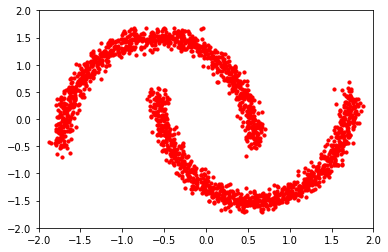

[-2.0241647 -3.1794927 -3.2390292 ... -2.2378867 -2.6753092 -3.41445  ]


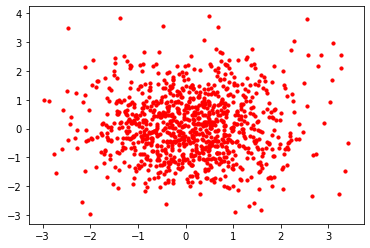

In [ ]:
from sklearn import cluster, datasets, mixture
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt

rng = jax.random.PRNGKey(0)
n_samples = 2000
X, y = datasets.make_moons(n_samples=n_samples, noise=.05)
X = StandardScaler().fit_transform(X)
xlim, ylim = [-2, 2], [-2, 2]
plt.scatter(X[:, 0], X[:, 1], s=10, color='red')
plt.xlim(xlim)
plt.ylim(ylim)
plt.show()

net_params, configs = init_nvp_chain(4)
y = sample_nvp_chain(net_params, configs, sample_n01, 1000)
print(log_prob_nvp_chain(net_params, configs, log_prob_n01, X))
plt.scatter(y[:, 0], y[:, 1], s=10, color='red')
plt.show()

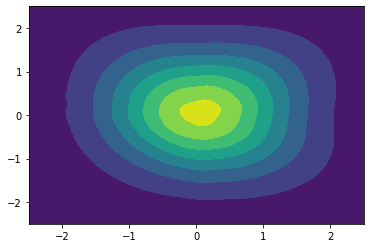

In [ ]:
def plot_theta(theta, color, xlim=(-2.5, 2.5), ylim=(-2.5, 2.5)):
  xx, yy = [np.linspace(*lims, num=100) for lims in [xlim, ylim]]
  flat_grid = np.stack(np.meshgrid(xx, yy), axis=-1).reshape(-1, 2)
  flat_logp = np.exp(log_prob_nvp_chain(theta, configs, log_prob_n01, flat_grid))
  mx_logp = flat_logp.reshape(len(xx), len(yy))
  mx_logp = np.nan_to_num(mx_logp)
  plt.contourf(xx, yy, mx_logp)
  plt.show()

plot_theta(net_params, '')

0
-2.841333


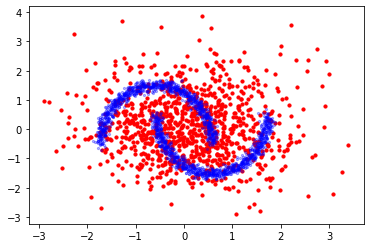

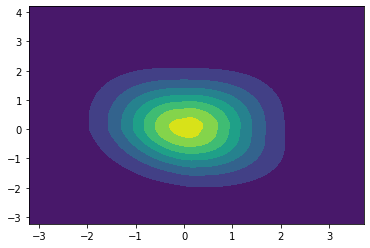

500
-2.0966253


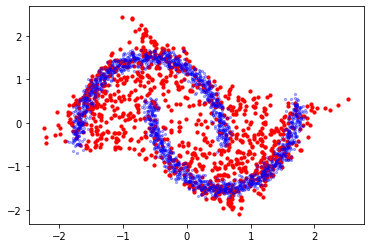

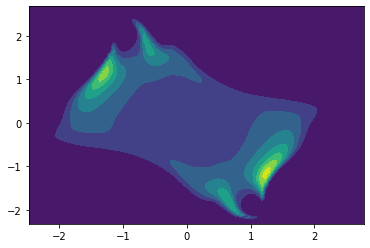

1000
-2.051633


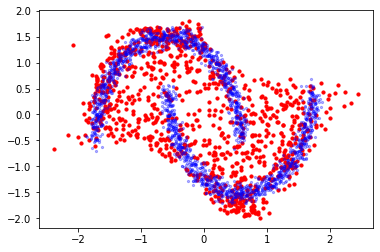

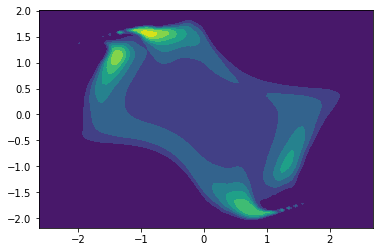

1500
-2.110539


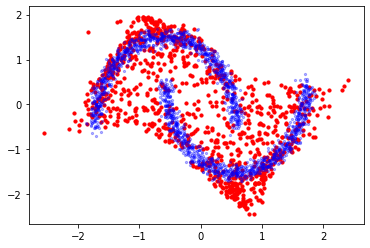

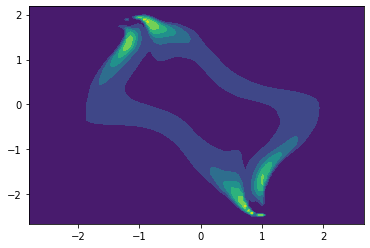

2000
-1.886146


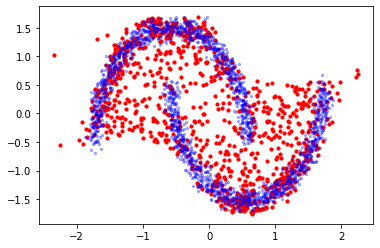

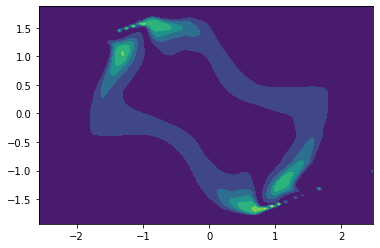

2500
-1.9220357


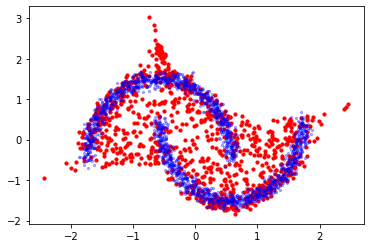

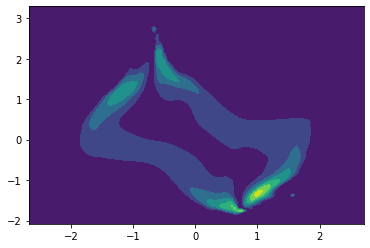

3000
-1.840898


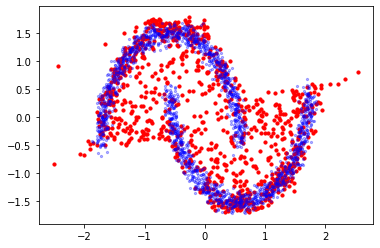

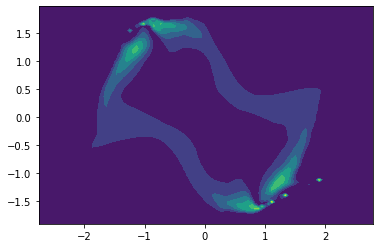

3500
-1.8772209


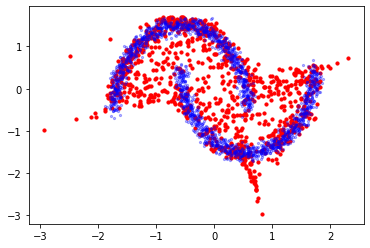

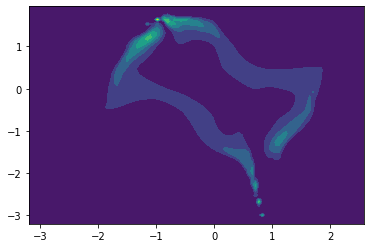

4000
-1.9750863


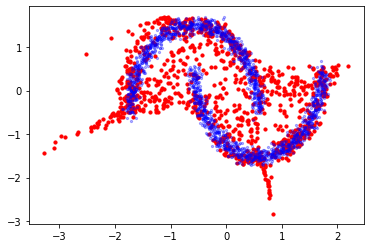

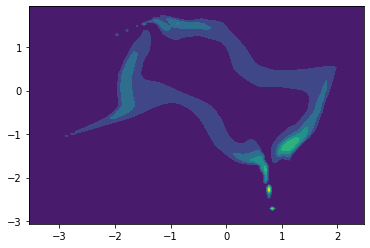

4500
-1.8625648


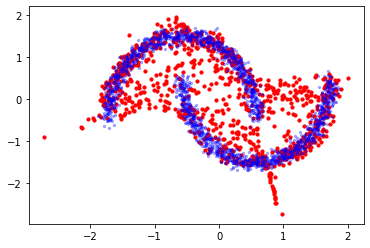

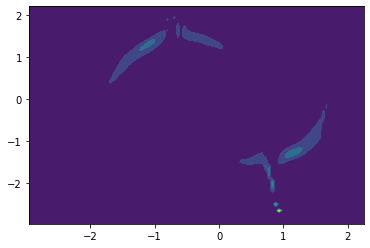

5000
-1.7596654


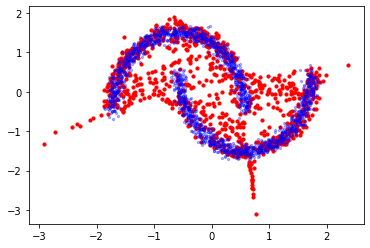

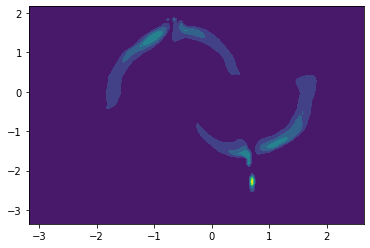

5500
-1.8380911


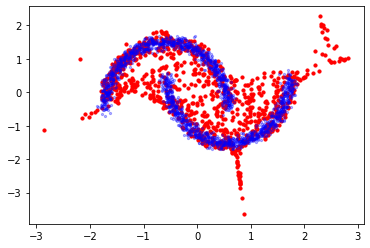

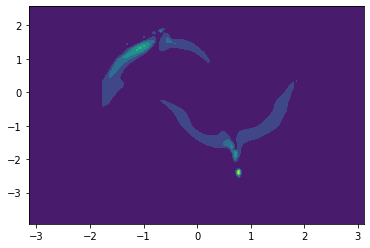

6000
-1.8156358


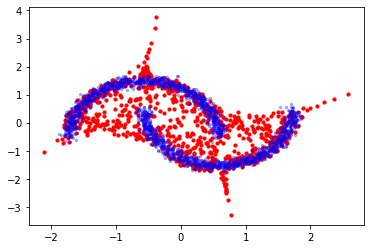

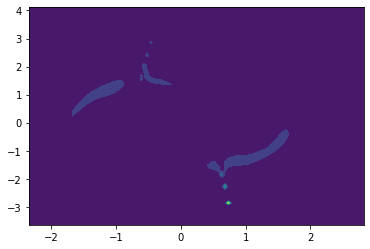

6500
-1.7316334


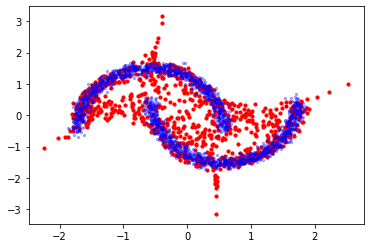

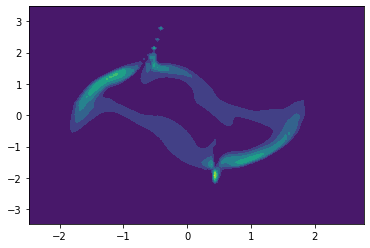

7000
-1.828742


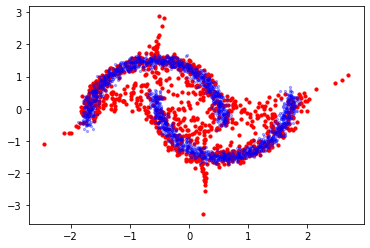

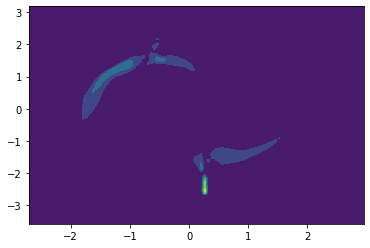

7500
-1.7232366


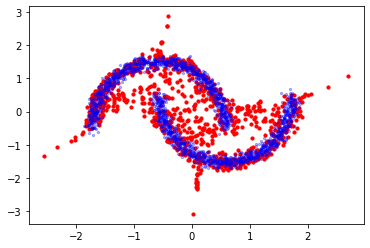

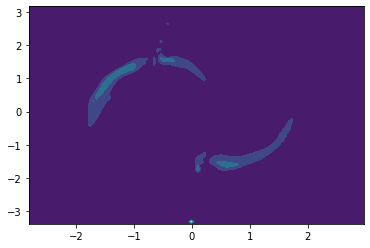

8000
-1.6951588


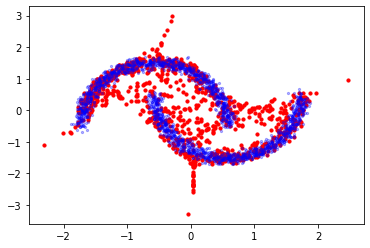

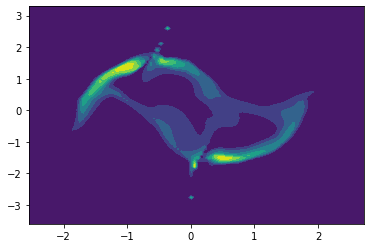

8500
-1.7208174


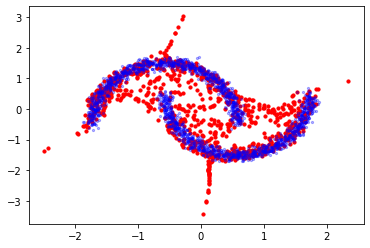

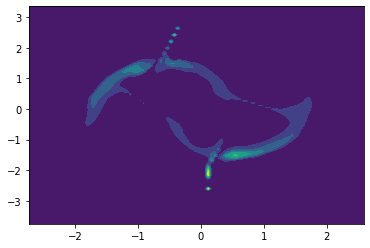

9000
-1.6599835


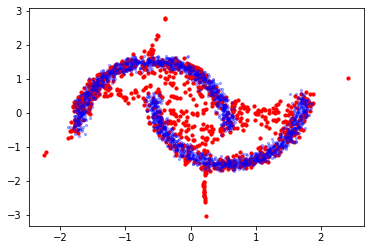

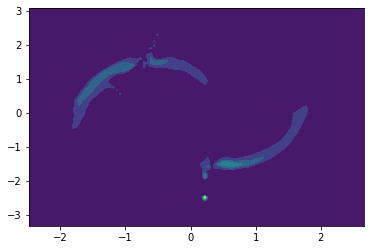

9500
-1.681931


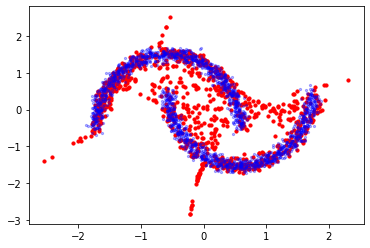

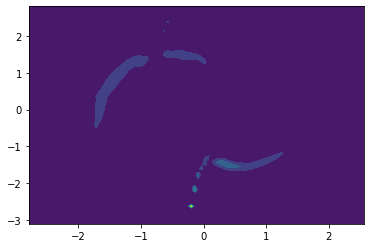

In [ ]:
from jax.experimental import optimizers
from jax import jit, grad
import numpy as onp

def loss(params, batch):
  return -np.mean(log_prob_nvp_chain(params, configs, log_prob_n01, batch))
opt_init, opt_update, get_params = optimizers.adam(step_size=1e-4)

@jit
def step(i, opt_state, batch):
  params = get_params(opt_state)
  g = grad(loss)(params, batch)
  return opt_update(i, g, opt_state)

iters = int(10000)
data_generator = (X[onp.random.choice(X.shape[0], 100)] for _ in range(iters))
opt_state = opt_init(net_params)
for i in range(iters):
  opt_state = step(i, opt_state, next(data_generator))
  
  if i % 500 == 0:
    print(i)
    net_params = get_params(opt_state)
    logps = log_prob_nvp_chain(net_params, configs, log_prob_n01, X)
    print(np.mean(logps))
    y = sample_nvp_chain(net_params, configs, sample_n01, 1000)
    plt.scatter(y[:, 0], y[:, 1], s=10, color='red')
    plt.scatter(X[:, 0], X[:, 1], s=5, color='blue', alpha=0.3)
    xlim, ylim = plt.gca().get_xlim(), plt.gca().get_ylim()
    plt.show()
    plot_theta(net_params, '', xlim, ylim)
    plt.show()

In [ ]:
def build_nvp_fns(depth=4, fit_n_iter=10000, fit_batch_size=100):
  net_params, configs = init_nvp_chain(depth)

  def logp_fn(data, theta):
    logp = log_prob_nvp_chain(theta, configs, log_prob_n01, data)
    return np.mean(logp)

  def gen_fn(z, theta):
    return transform_nvp_chain(z, theta, configs)
    
  def prior_sample(rng, n):
    return jax.random.normal(rng, (n, 2))

  def prior_logp(data):
    dim = 2
    mean = np.zeros(dim)
    cov = np.eye(dim)
    return np.mean(jax.scipy.stats.multivariate_normal.logpdf(data, mean, cov))

  def fit_fn(data):
    print('estimating thata_i')
    net_params, configs = init_nvp_chain(depth)

    def loss(params, batch):
      return -np.mean(log_prob_nvp_chain(params, configs, log_prob_n01, batch))
    opt_init, opt_update, get_params = optimizers.adam(step_size=1e-4)

    @jax.jit
    def step(i, opt_state, batch):
      params = get_params(opt_state)
      g = grad(loss)(params, batch)
      return opt_update(i, g, opt_state)

    opt_state = opt_init(net_params)
    for i in range(fit_n_iter):
      batch = data[onp.random.choice(data.shape[0], fit_batch_size)]
      opt_state = step(i, opt_state, batch)

    theta = get_params(opt_state)
    return theta

  return [fit_fn, logp_fn, gen_fn, prior_sample, prior_logp]

def plot_data(data, color):
  plt.scatter(*data.T, marker='x', c=color, alpha=0.7)

nvp_fns = build_nvp_fns(fit_n_iter=1000)

In [ ]:
import numpy as onp

In [ ]:
drng_a, drng_b = jax.random.split(jax.random.PRNGKey(1))
mult_norm_prior_sample_2d = build_mult_norm_prior_sample(dim=2)

theta_a_gt = np.array([1.0, 1.0]), np.array([[0.5, 0.7], [-0.5, 0.3]])
theta_t_gt = np.array([4.0, -2.0]), np.array([[0.5, 3.0], [3.0, -2.0]])
data_a = mult_norm_gen_norm_prior(mult_norm_prior_sample_2d(drng_a, 100), theta_a_gt)
data_a_for_t = mult_norm_gen_norm_prior(mult_norm_prior_sample_2d(drng_b, 100), theta_a_gt)
data_b = mult_norm_gen_norm_prior(data_a_for_t, theta_t_gt)

In [ ]:
from jax import grad

In [ ]:
theta_a, theta_b, loss = build_translation_objective(data_a, data_b, *nvp_fns)

estimating thata_i
estimating thata_i


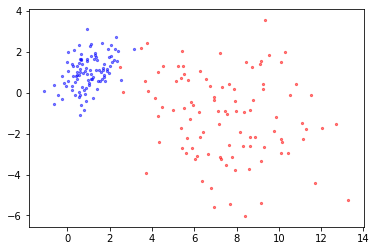

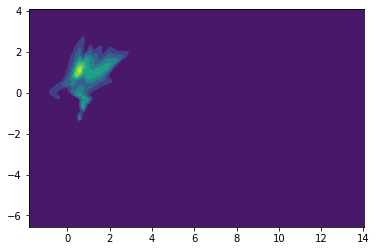

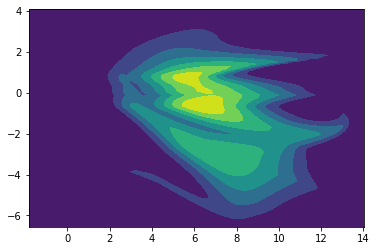

In [ ]:
def plot_theta(theta, color, xlim=(-2.5, 2.5), ylim=(-2.5, 2.5)):
  xx, yy = [np.linspace(*lims, num=100) for lims in [xlim, ylim]]
  flat_grid = np.stack(np.meshgrid(xx, yy), axis=-1).reshape(-1, 2)
  flat_logp = np.exp(log_prob_nvp_chain(theta, configs, log_prob_n01, flat_grid))
  mx_logp = flat_logp.reshape(len(xx), len(yy))
  mx_logp = np.nan_to_num(mx_logp)
  plt.contourf(xx, yy, mx_logp)
  plt.show()


plt.scatter(*data_a.T, s=5, color='blue', alpha=0.5)
plt.scatter(*data_b.T, s=5, color='red', alpha=0.5)
xlim, ylim = plt.gca().get_xlim(), plt.gca().get_ylim()
plt.show()
plot_theta(theta_a, '', xlim, ylim)
plt.show()
plot_theta(theta_b, '', xlim, ylim)
plt.show()

In [ ]:
def quiver_flow(theta_t, n=10, scale=1, lims=None):
  lims = lims or (-2, 2)
  meshgrid = np.meshgrid(np.linspace(*lims[0], num=n), np.linspace(*lims[1], num=n))
  grid = np.stack(meshgrid, axis=0).reshape(2, -1).T
  mapped = nvp_gen_fn(grid, theta_t)
  diff = mapped - grid
  X, Y = grid.T
  U, V = diff.T
  M = np.hypot(U, V)
  plt.quiver(X, Y, U, V, M, scale=scale)

0 None


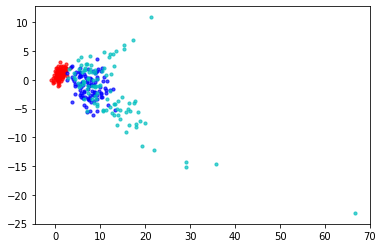

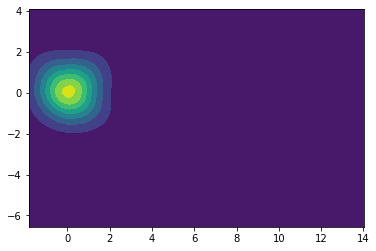

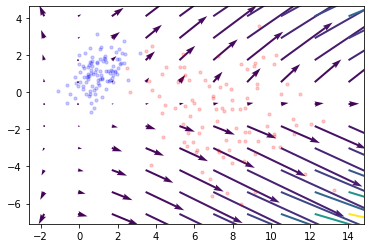

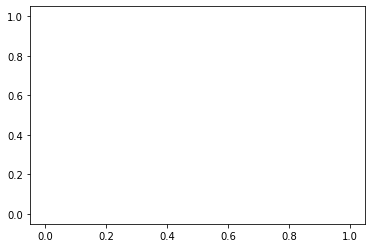

5 11.2963


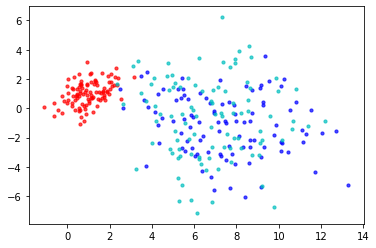

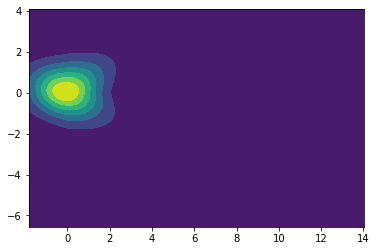

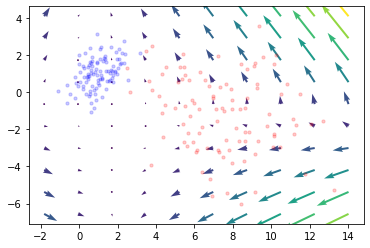

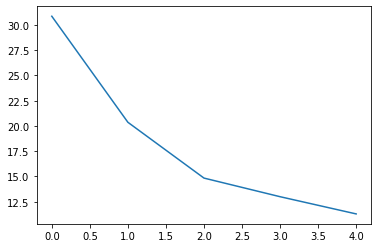

10 8.547196


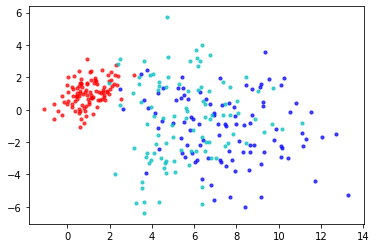

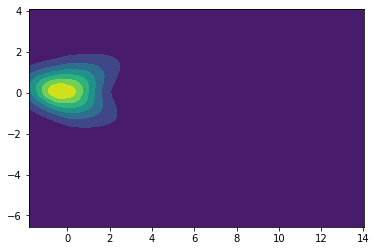

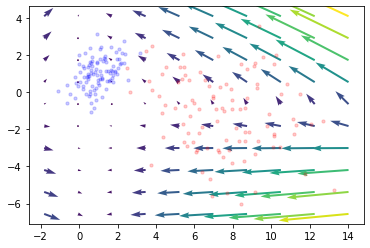

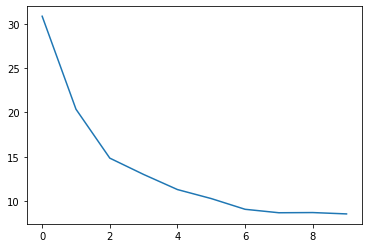

15 7.675494


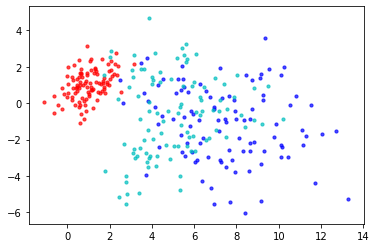

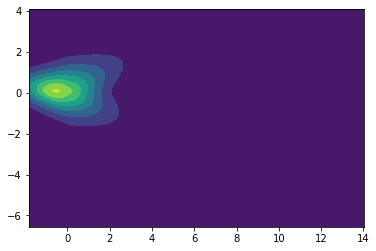

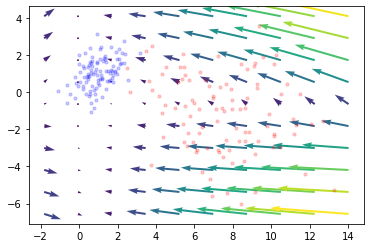

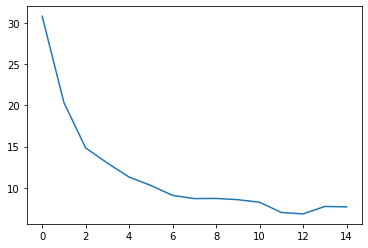

20 5.23849


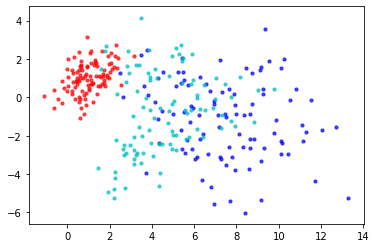

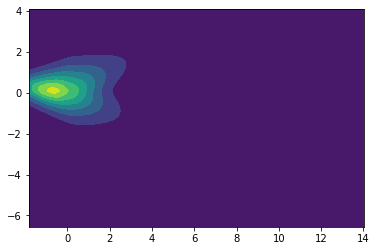

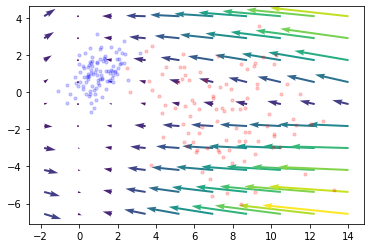

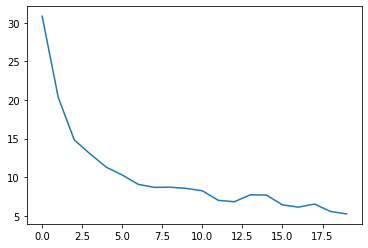

25 5.0493536


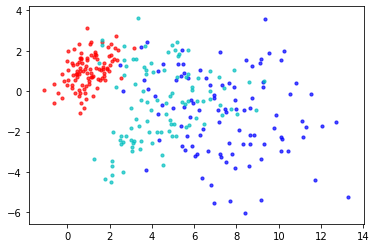

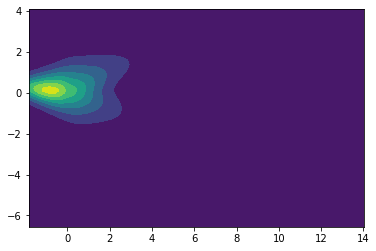

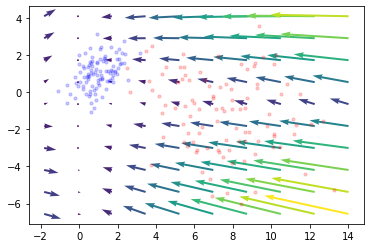

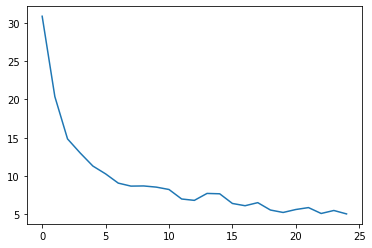

30 4.246684


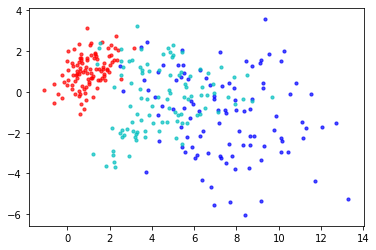

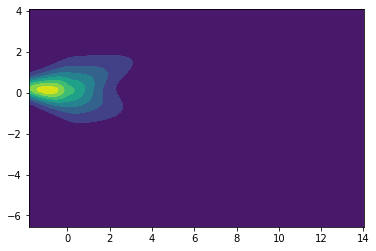

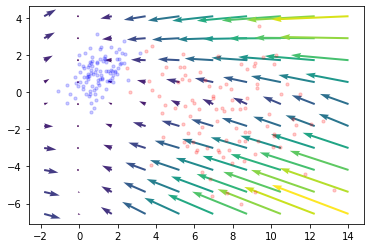

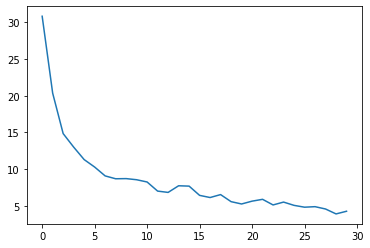

35 4.0223837


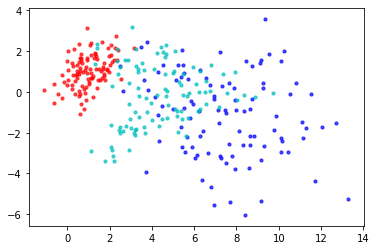

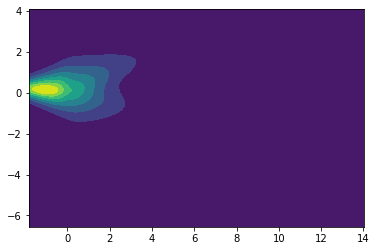

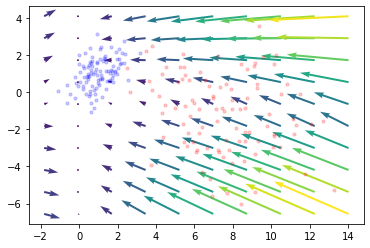

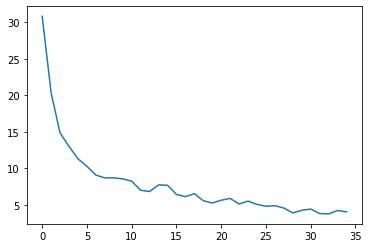

40 3.4090242


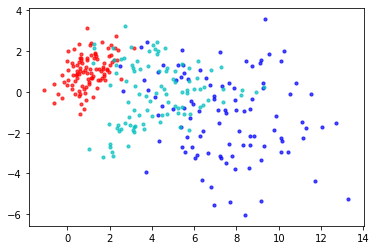

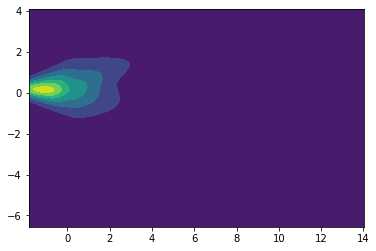

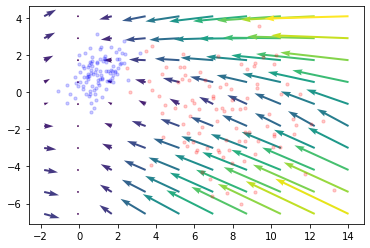

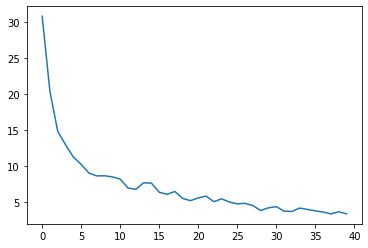

45 3.3425283


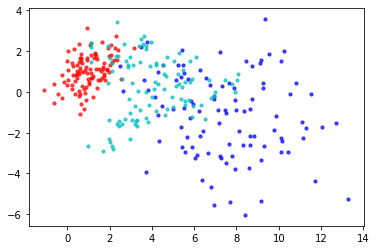

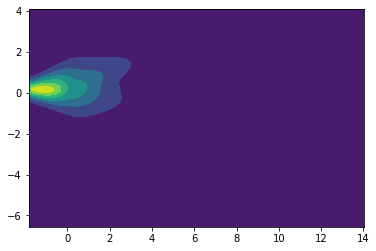

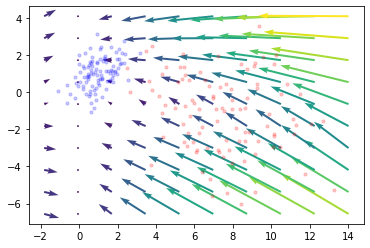

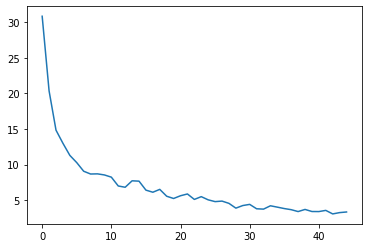

50 3.0638514


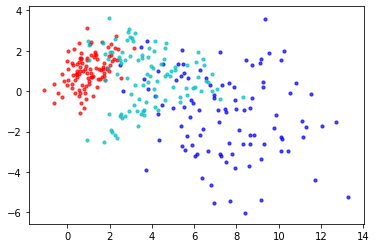

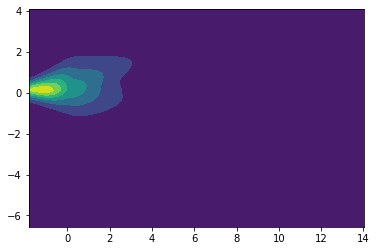

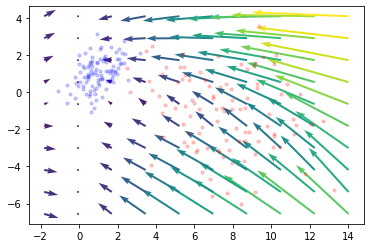

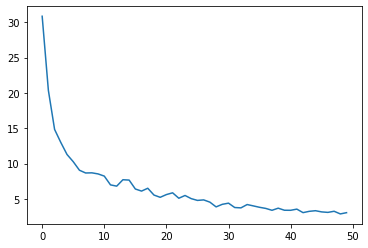

55 2.7304792


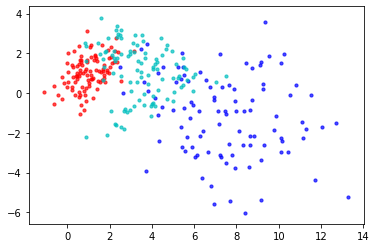

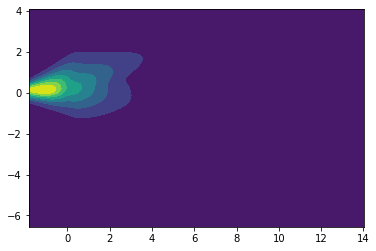

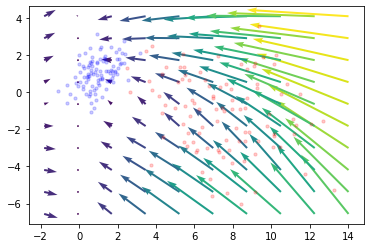

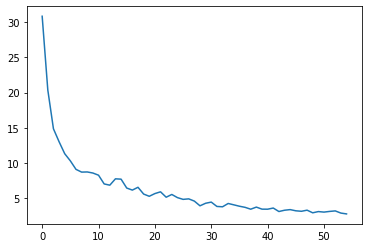

60 2.469842


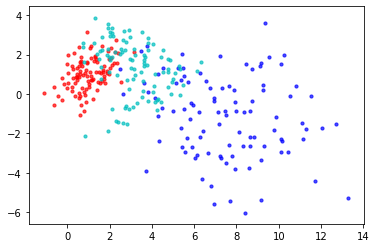

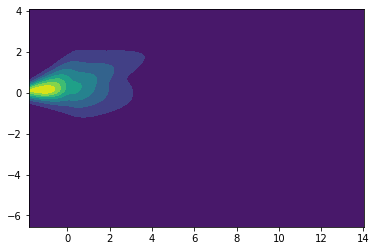

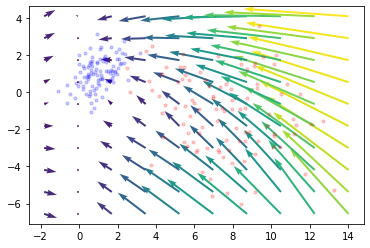

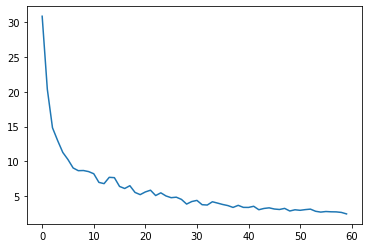

65 2.6321096


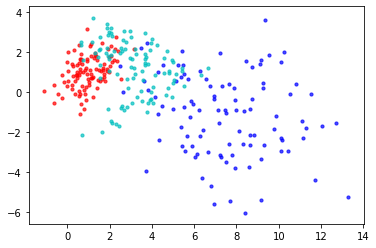

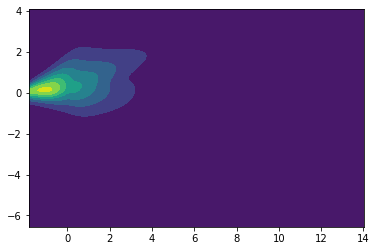

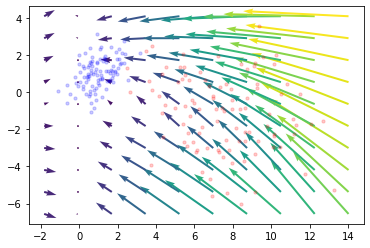

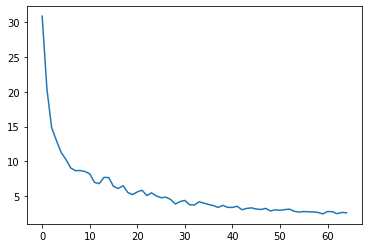

70 2.5807486


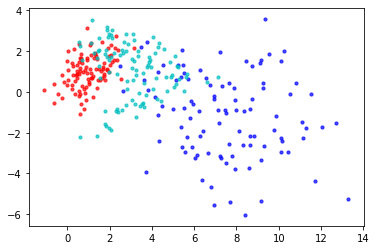

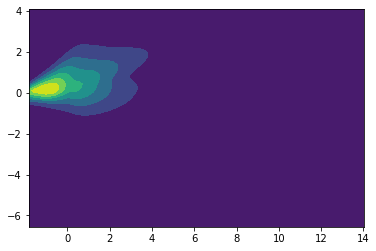

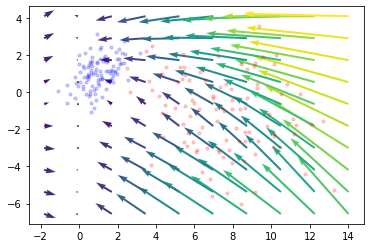

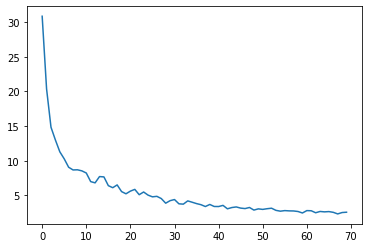

75 2.3024797


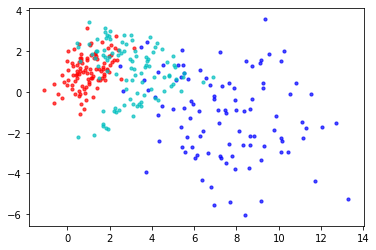

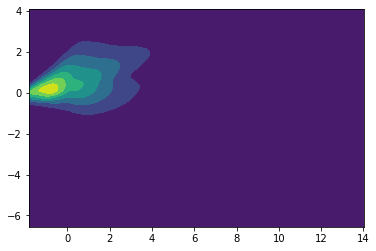

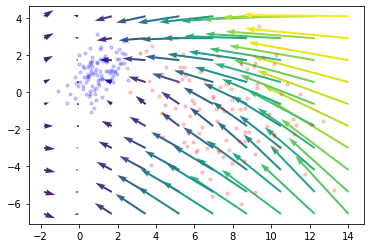

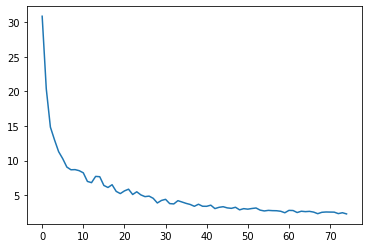

80 2.2368155


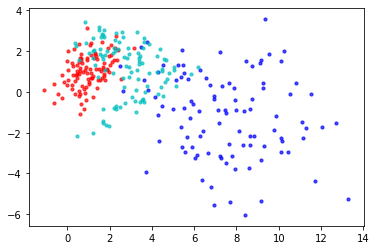

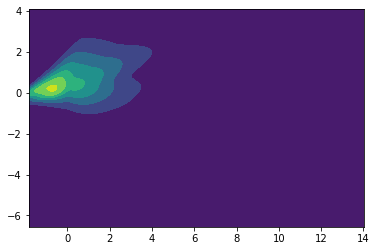

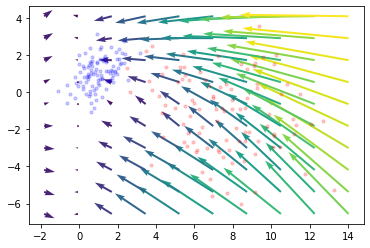

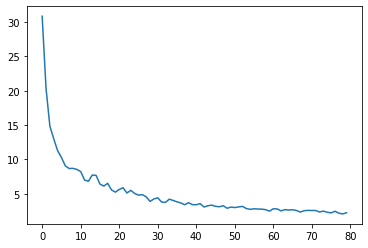

85 1.9808912


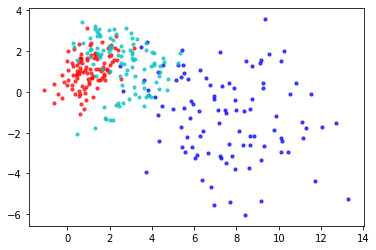

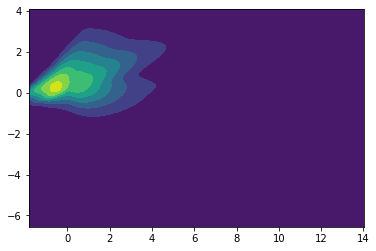

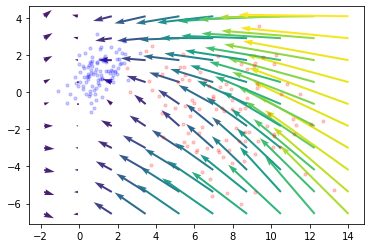

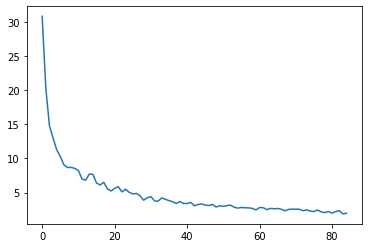

90 2.057208


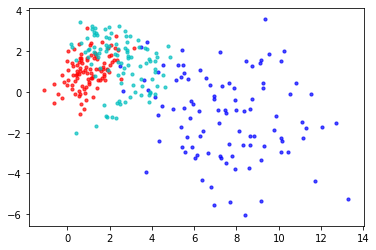

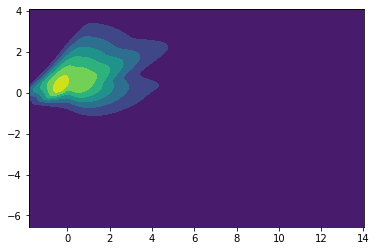

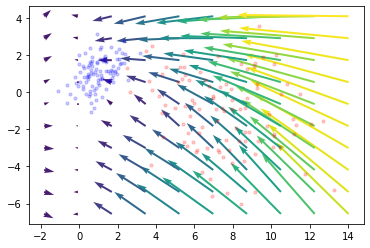

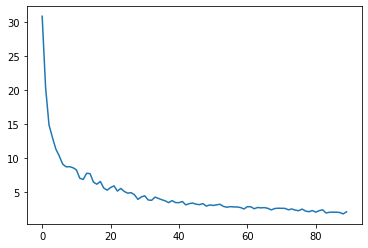

95 1.832305


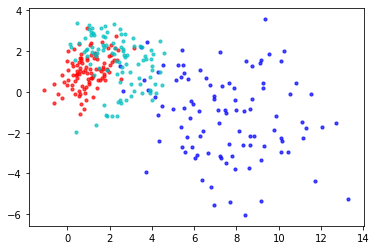

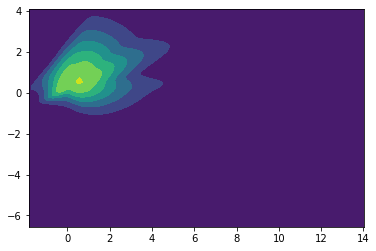

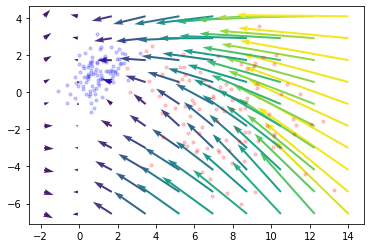

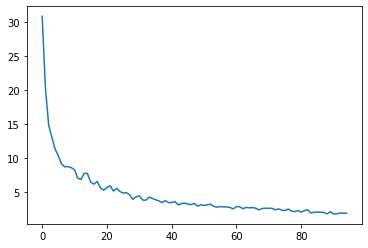

100 1.7004309


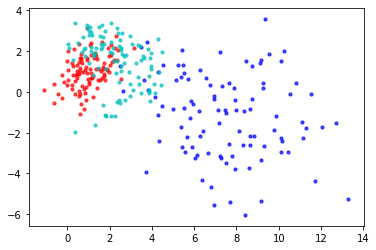

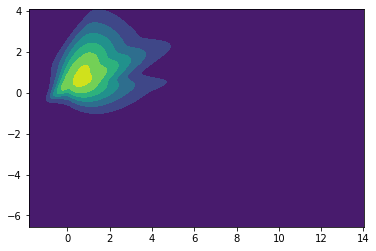

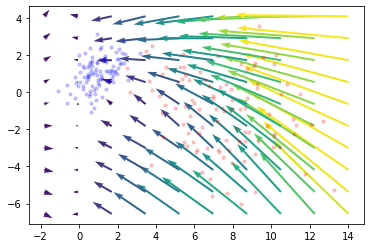

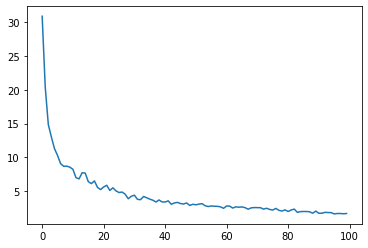

105 1.6370726


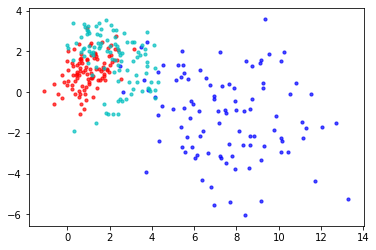

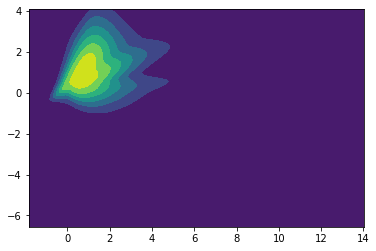

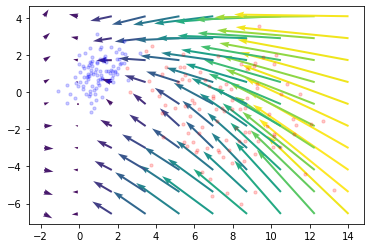

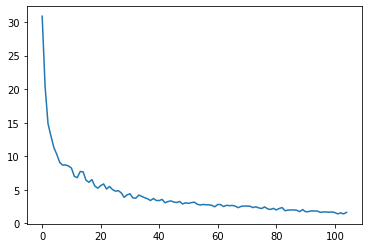

110 1.430728


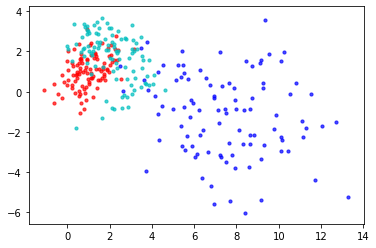

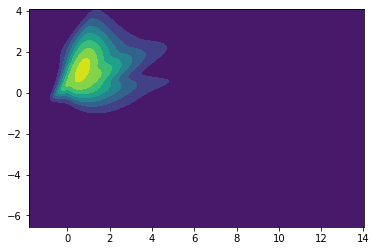

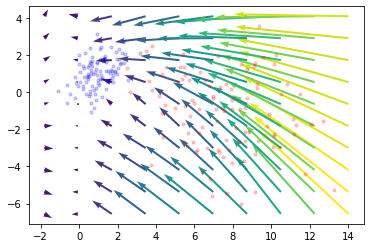

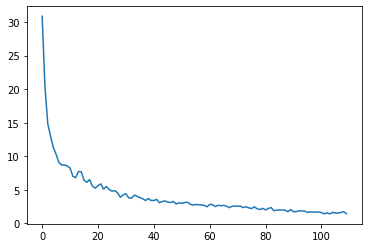

115 1.3880682


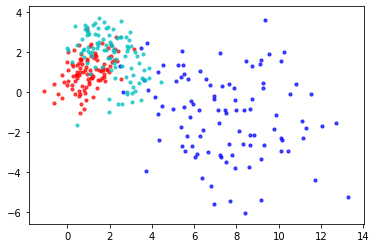

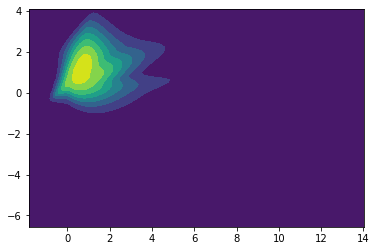

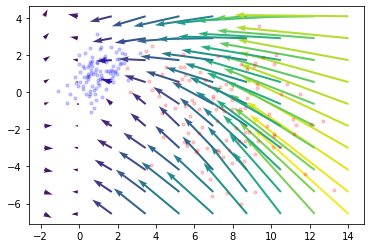

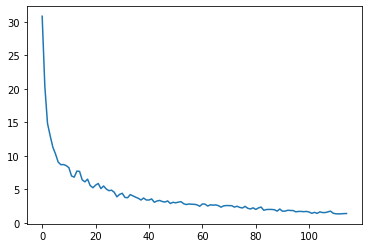

120 1.3875761


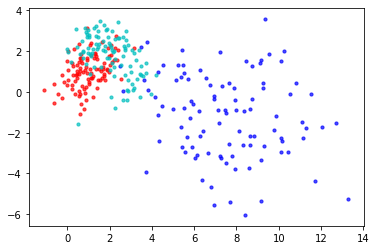

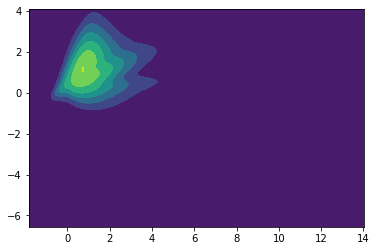

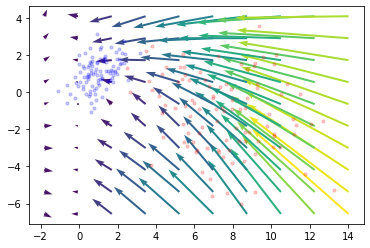

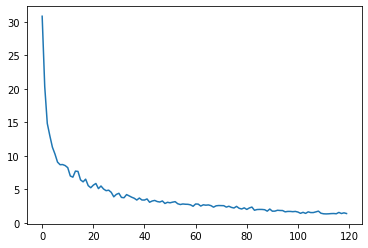

125 1.3398275


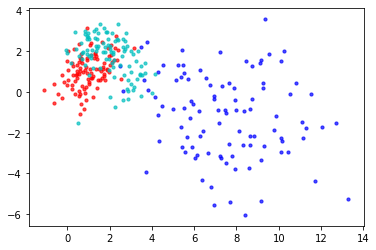

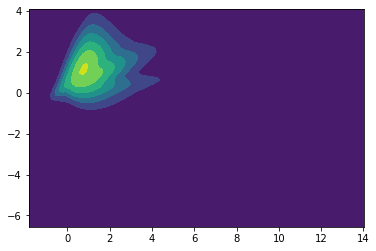

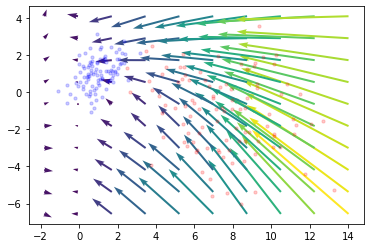

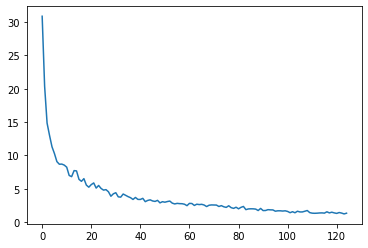

130 1.231658


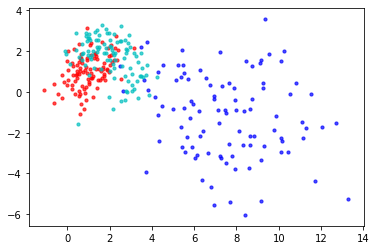

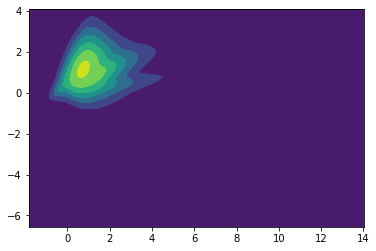

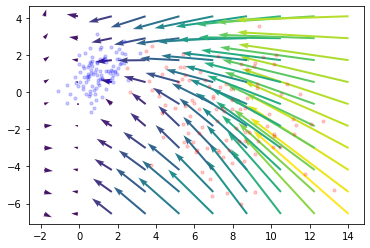

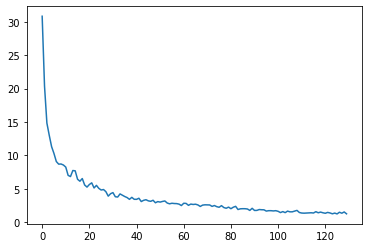

135 1.2796984


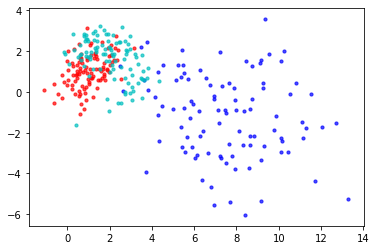

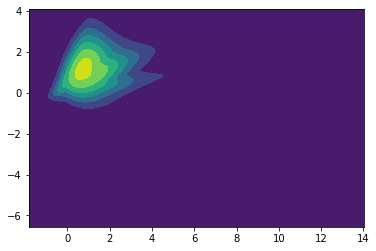

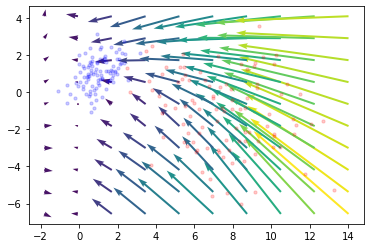

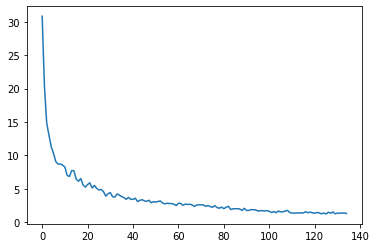

140 1.2099504


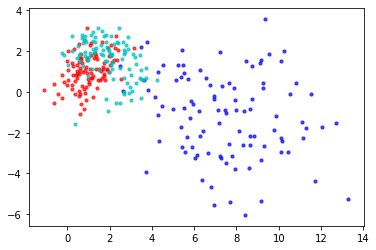

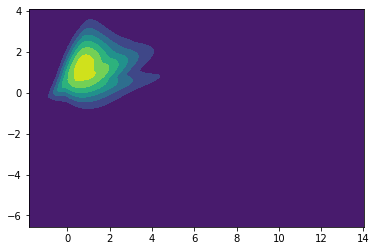

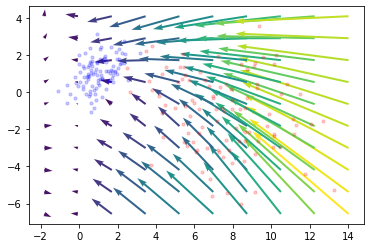

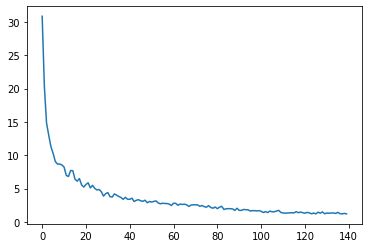

145 1.237443


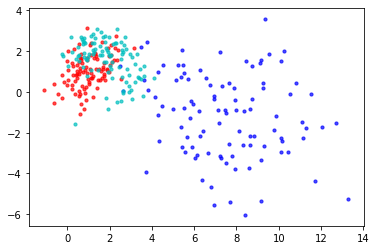

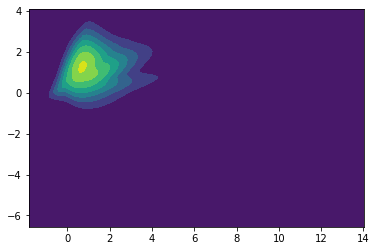

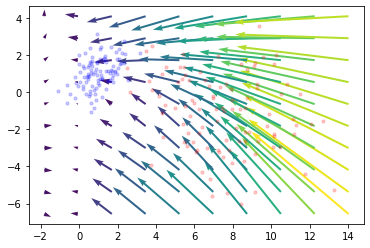

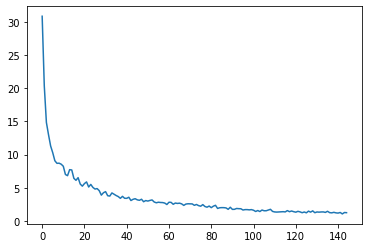

150 1.2959833


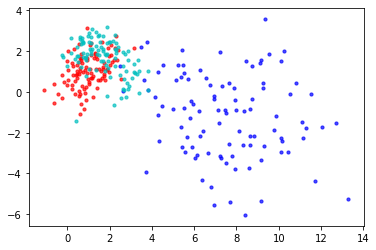

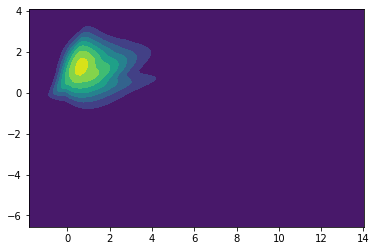

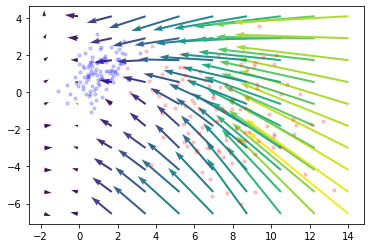

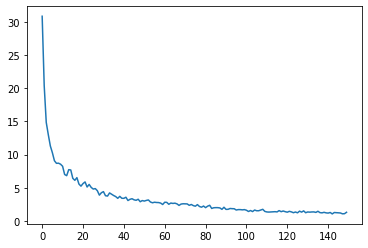

155 1.0338755


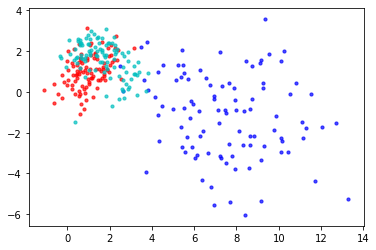

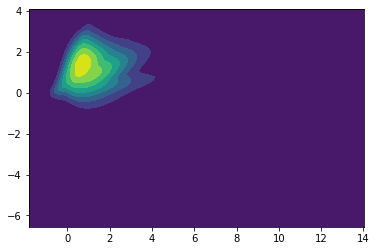

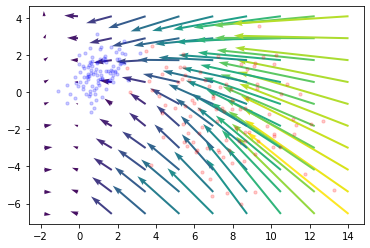

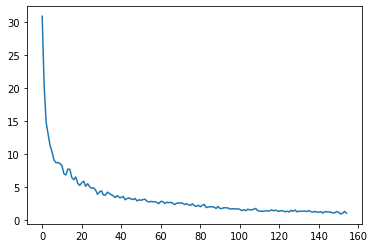

160 1.2472811


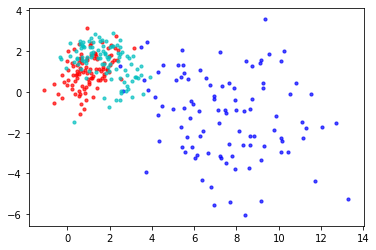

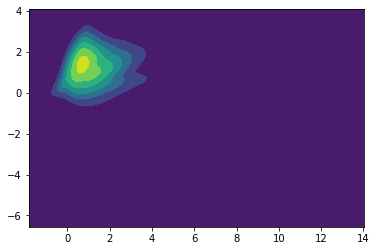

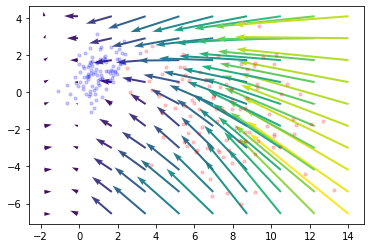

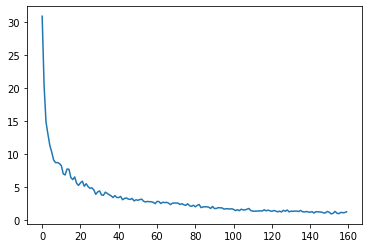

165 1.1540804


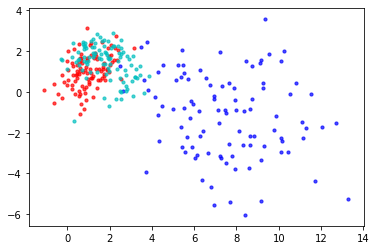

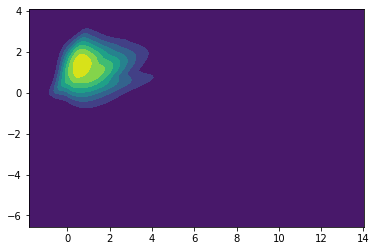

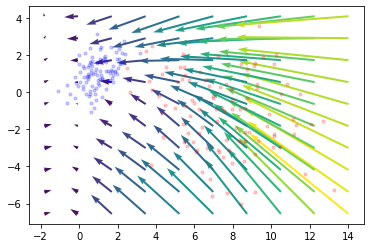

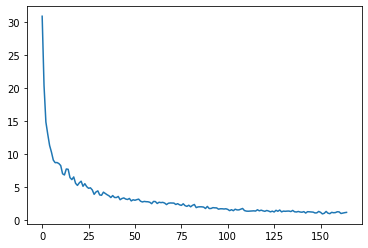

170 1.1437807


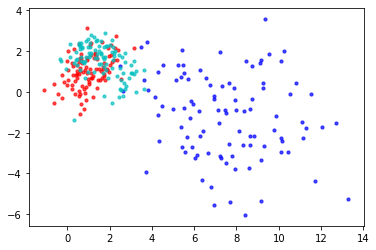

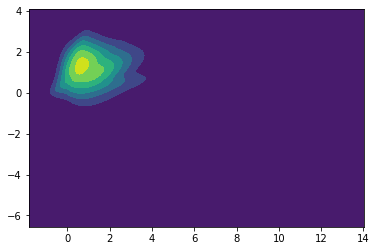

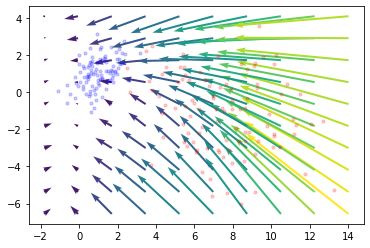

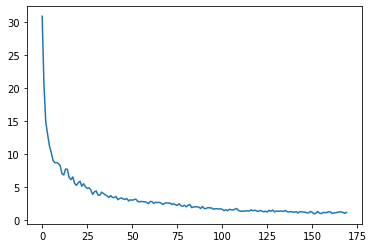

175 0.93575954


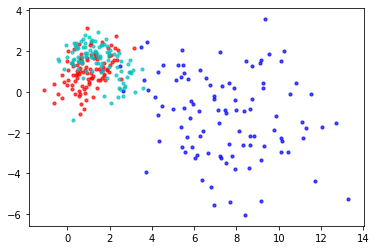

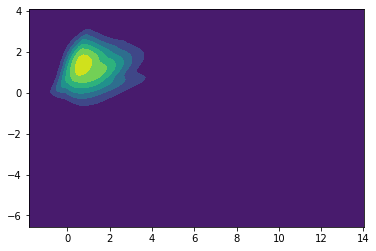

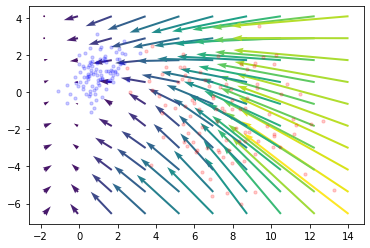

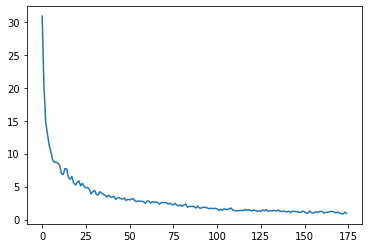

180 0.97393703


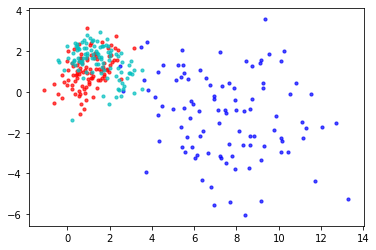

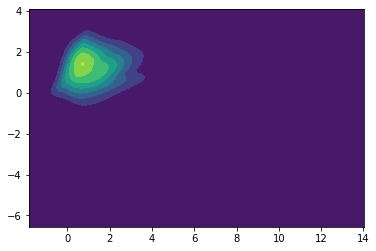

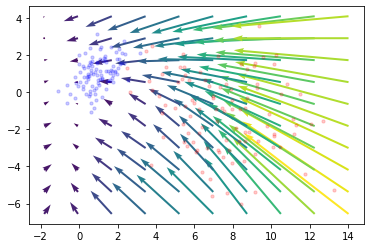

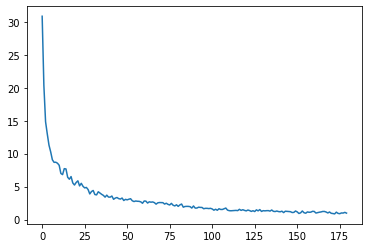

185 0.85864353


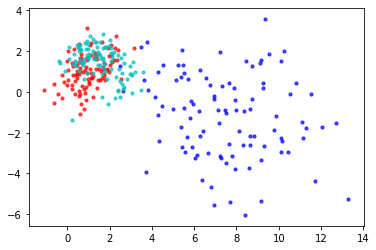

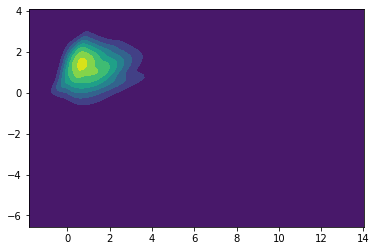

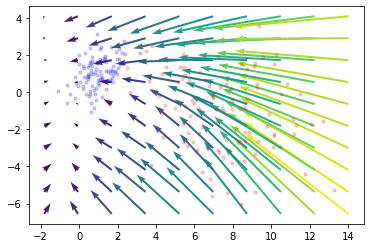

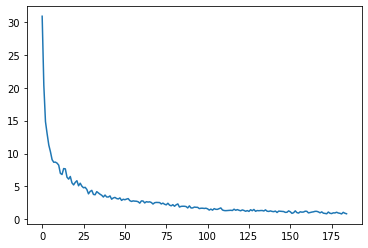

190 0.9410925


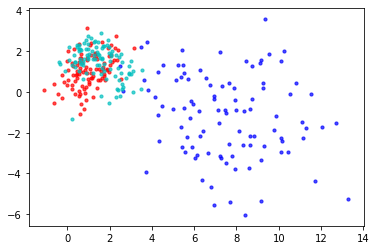

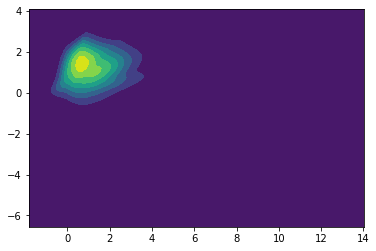

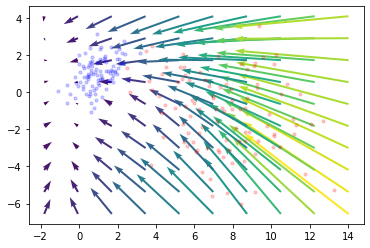

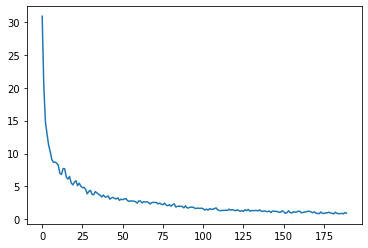

195 1.1153555


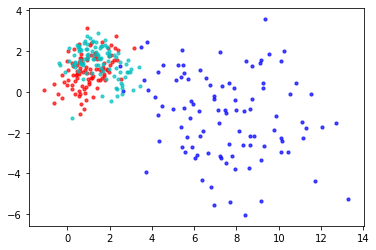

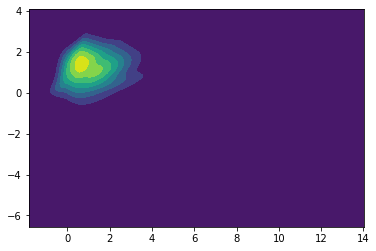

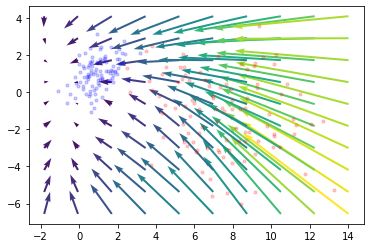

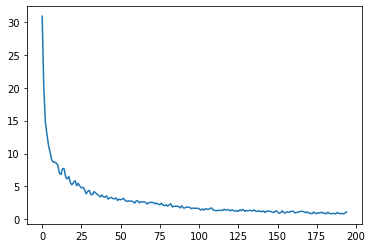

200 1.0410643


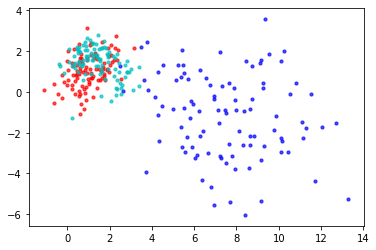

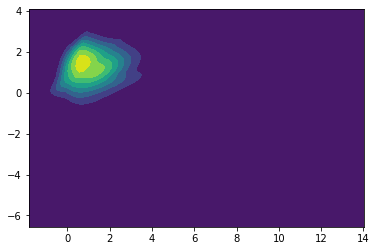

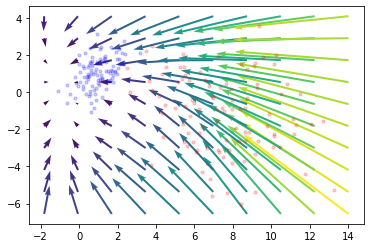

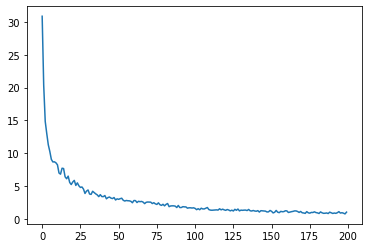

205 1.0176954


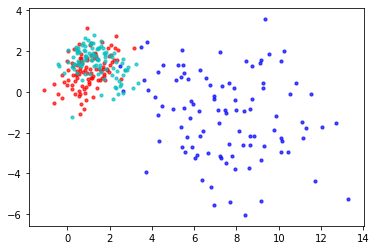

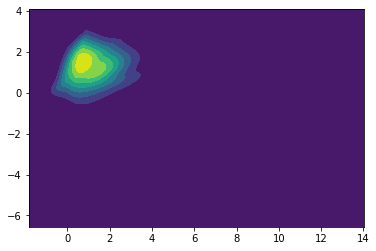

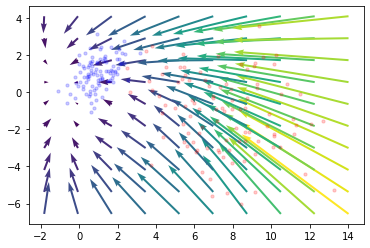

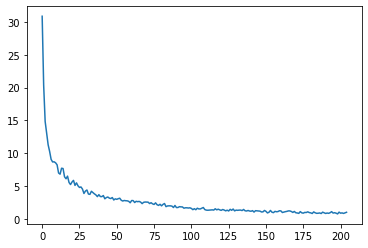

210 0.9002657


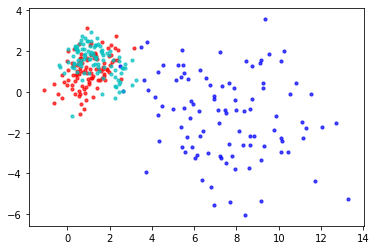

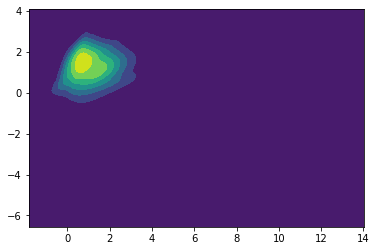

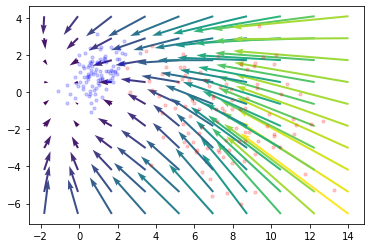

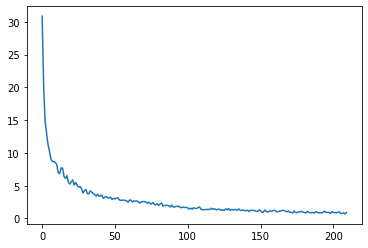

215 0.83339405


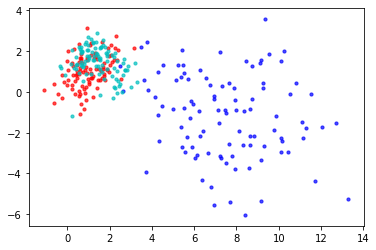

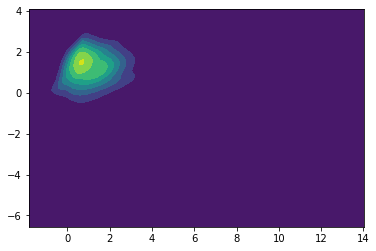

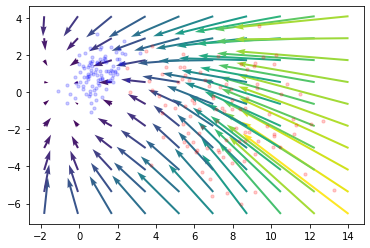

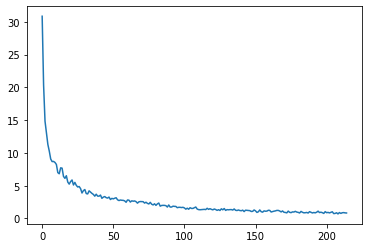

220 0.7051039


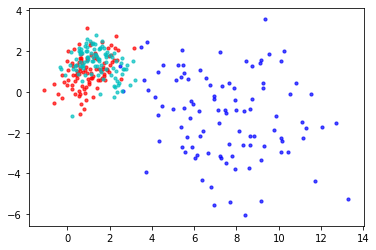

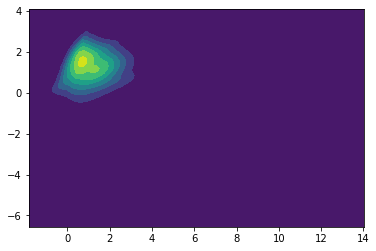

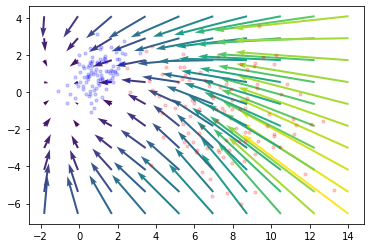

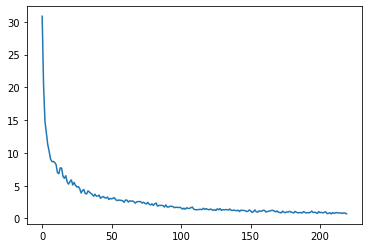

225 0.7759485


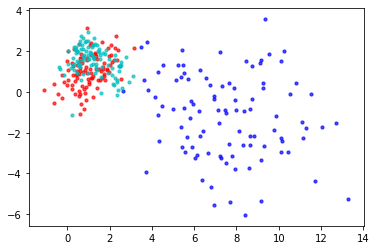

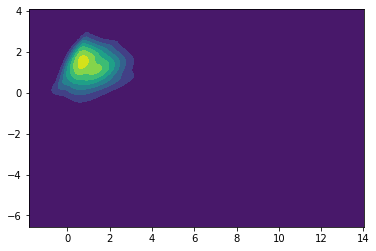

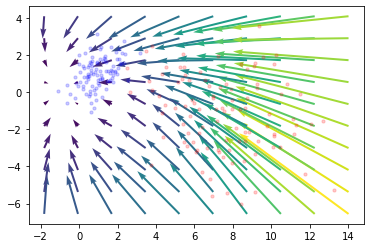

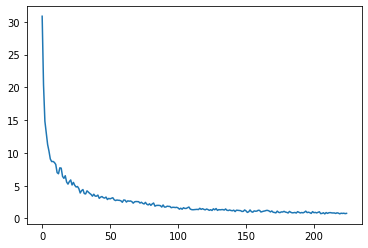

230 0.74991703


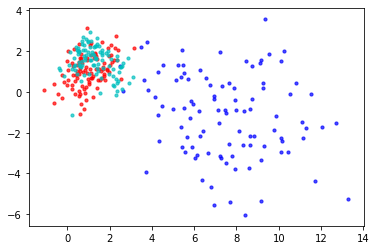

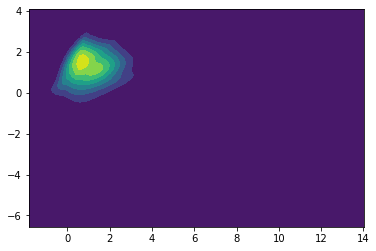

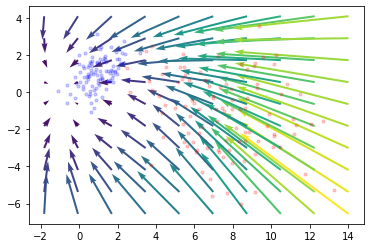

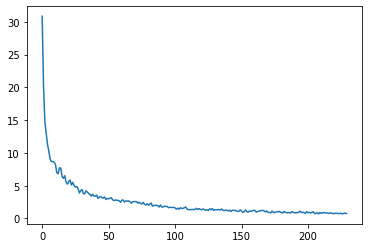

235 0.87183666


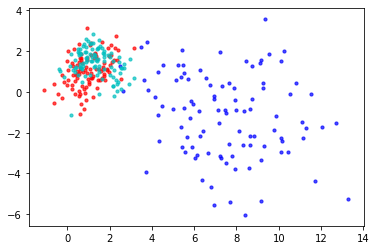

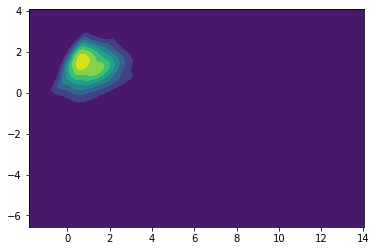

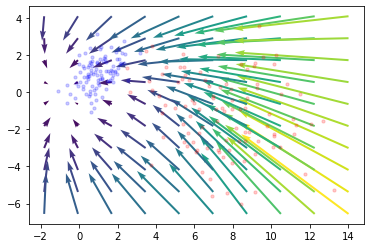

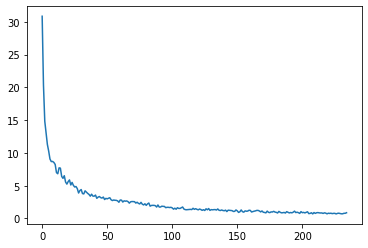

240 0.66538906


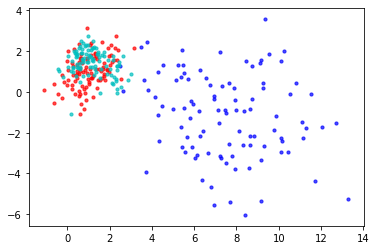

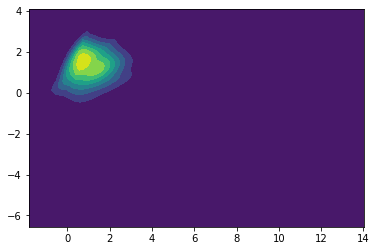

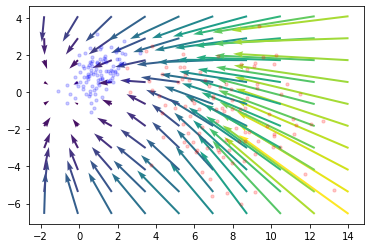

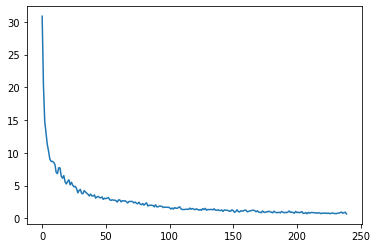

245 0.6412153


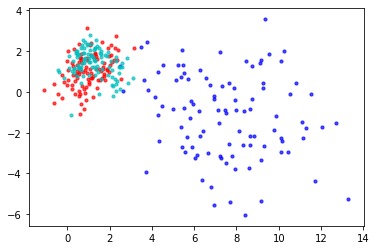

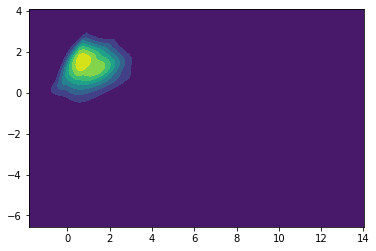

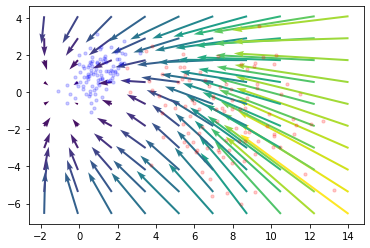

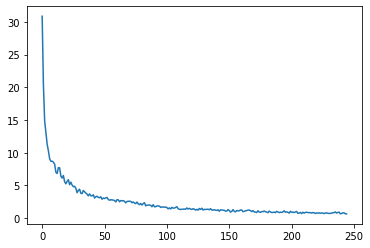

250 0.50542927


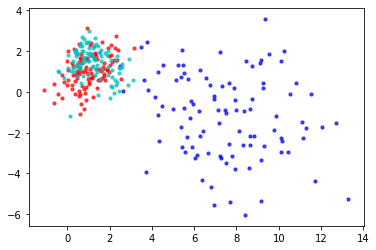

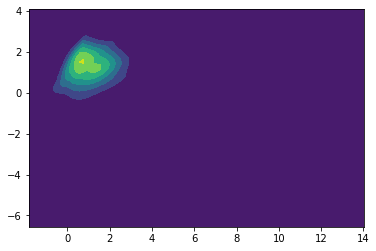

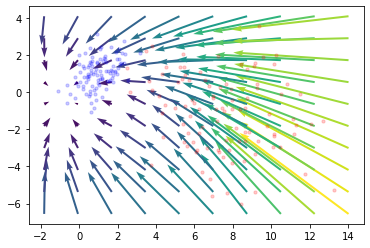

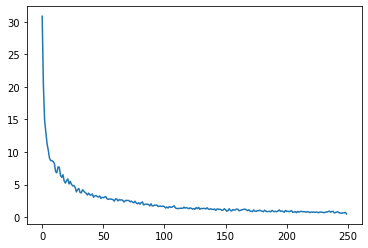

255 0.886363


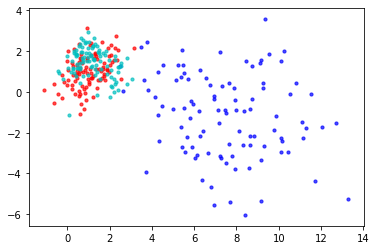

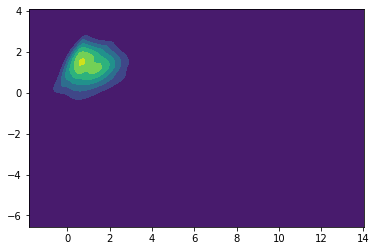

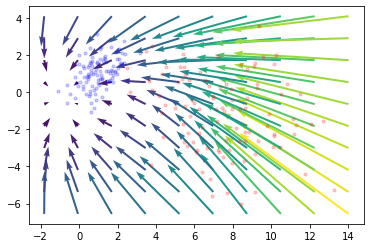

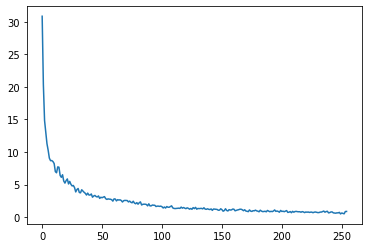

260 0.6639471


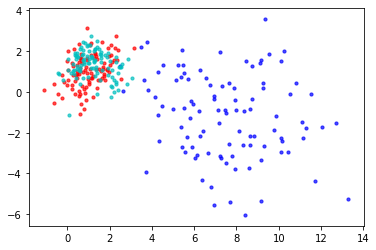

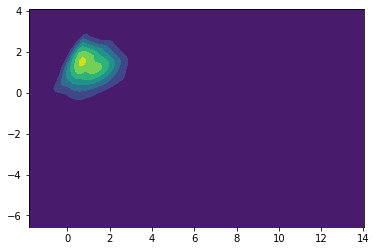

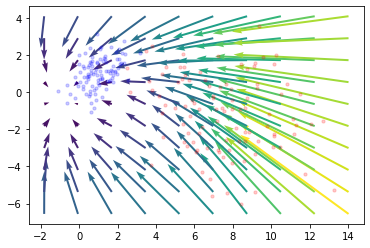

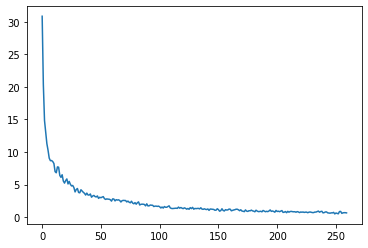

265 0.67864895


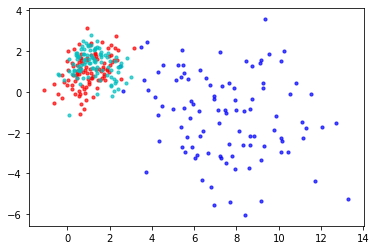

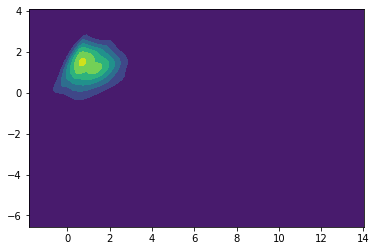

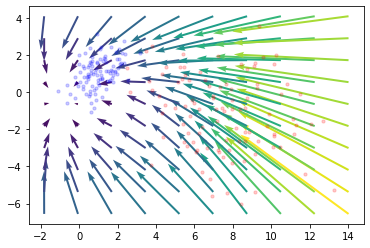

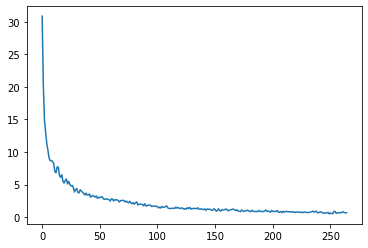

270 0.8018255


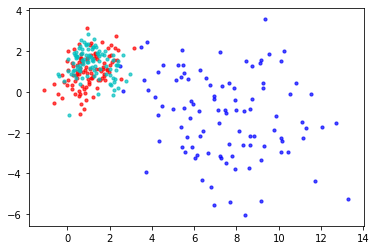

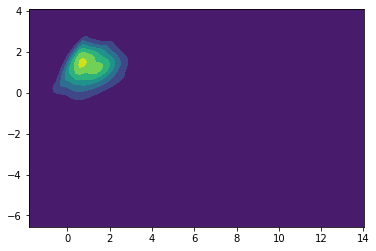

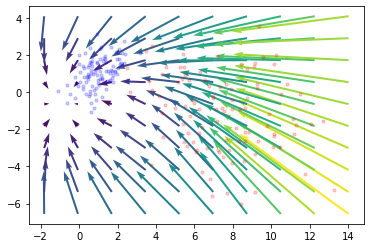

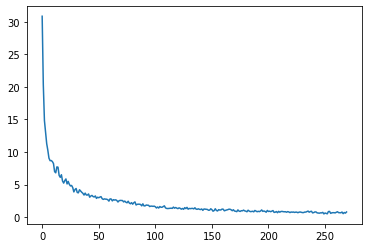

275 0.79882336


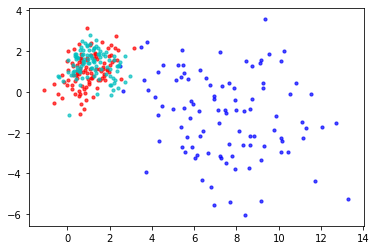

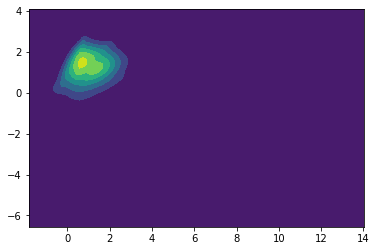

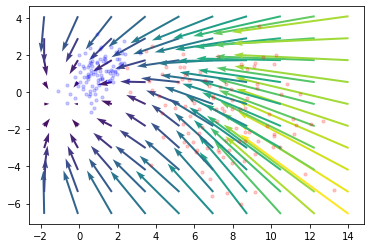

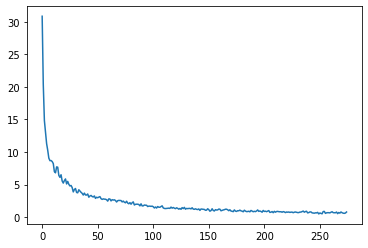

280 0.86801815


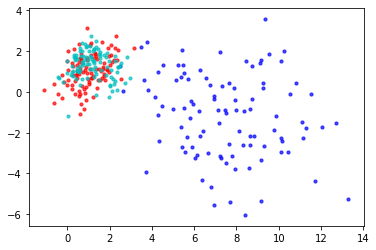

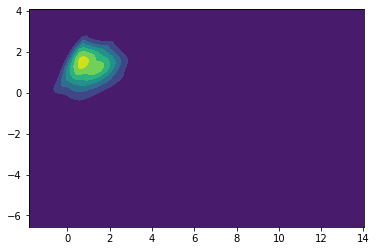

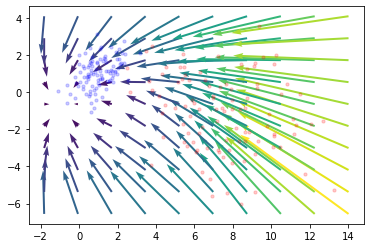

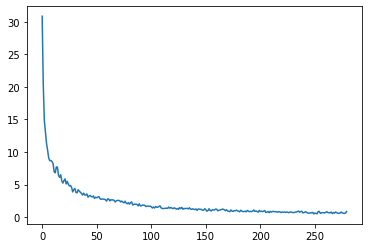

285 0.7938814


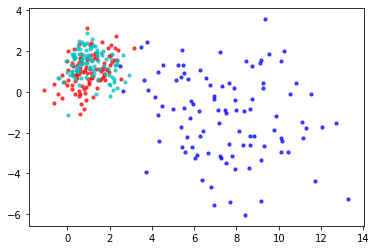

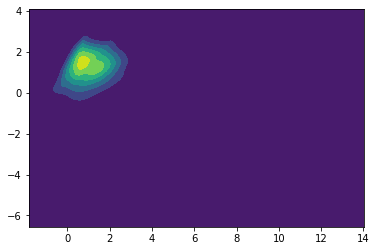

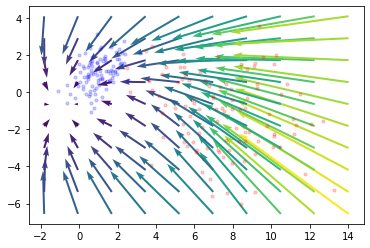

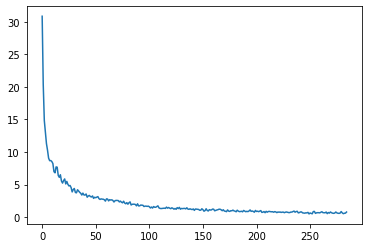

290 0.6087446


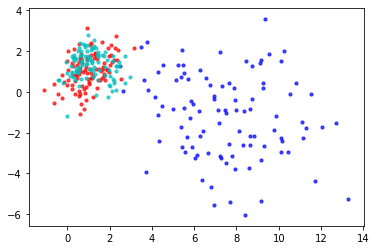

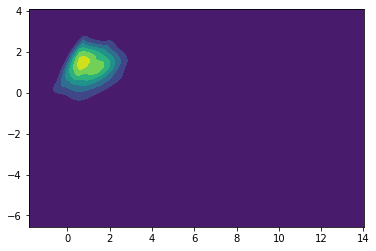

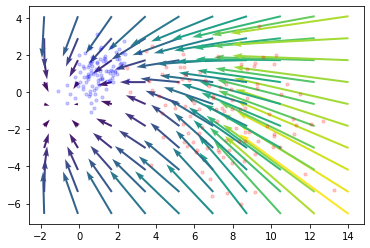

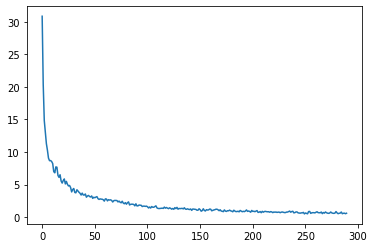

295 0.37970066


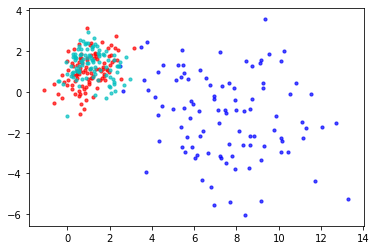

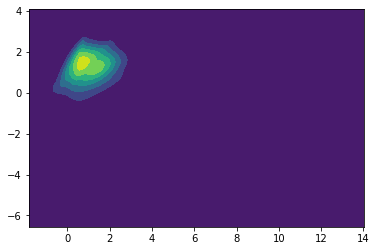

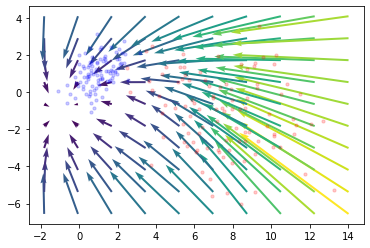

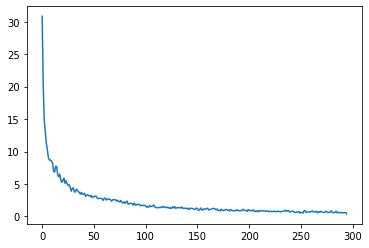

300 0.5006609


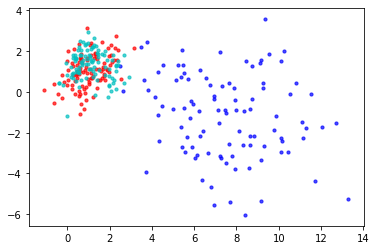

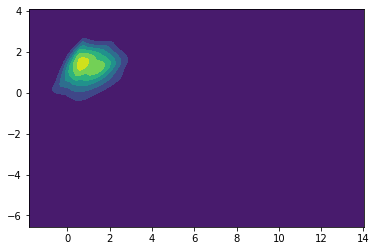

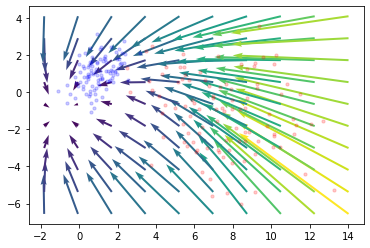

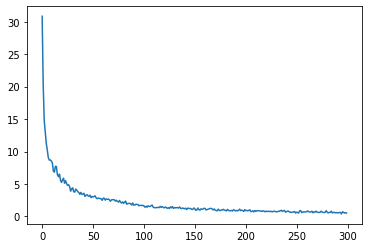

305 0.5612745


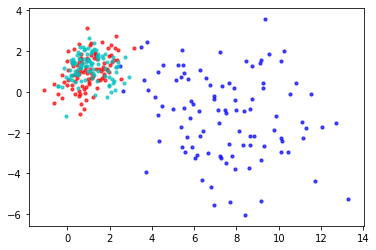

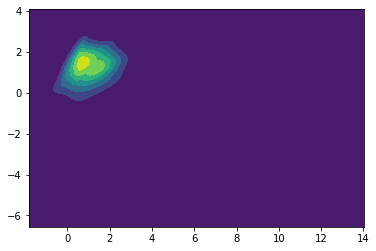

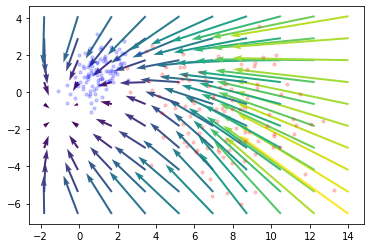

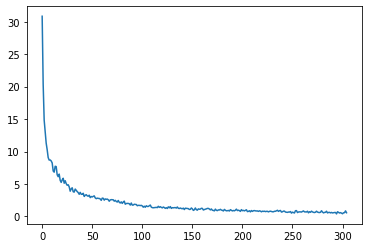

310 0.7038202


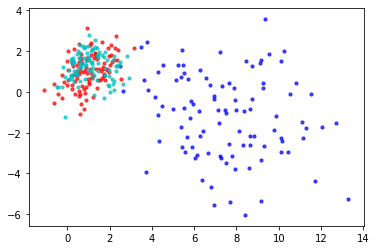

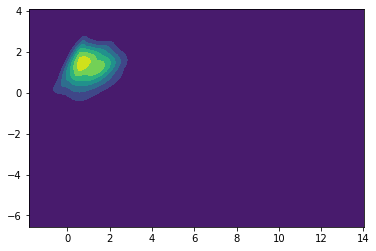

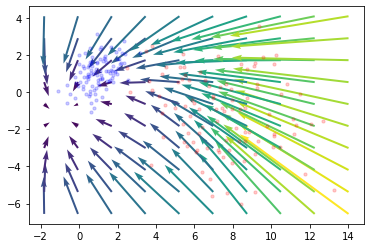

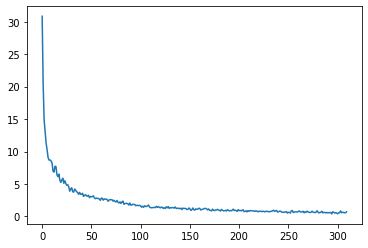

315 0.60841656


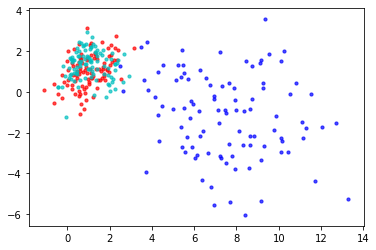

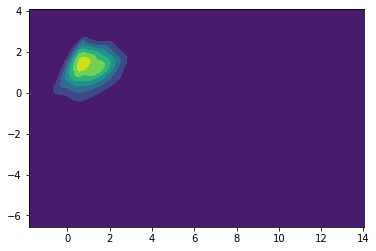

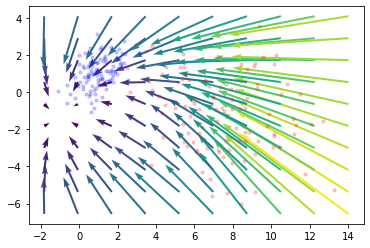

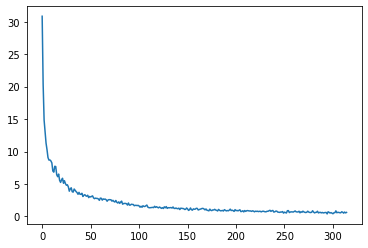

320 0.54666996


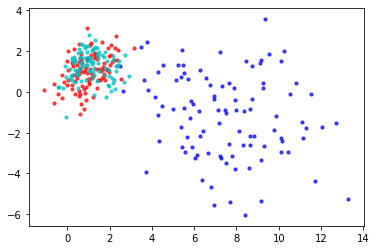

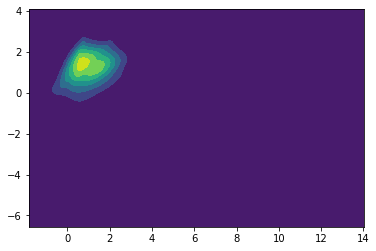

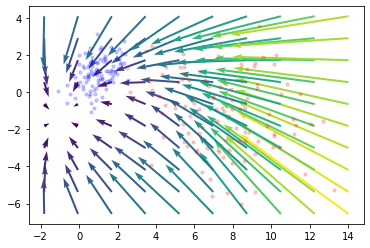

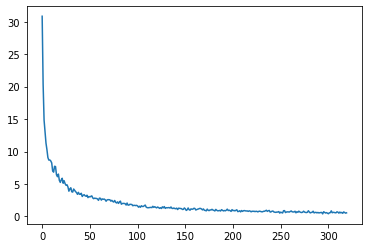

325 0.627059


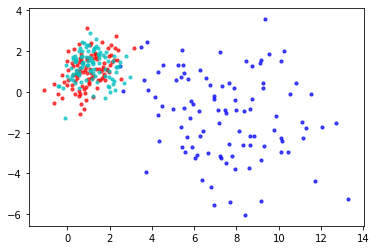

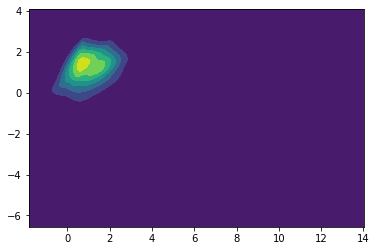

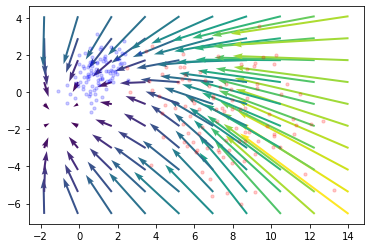

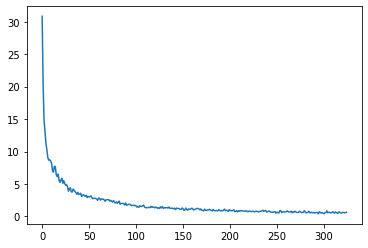

330 0.43944263


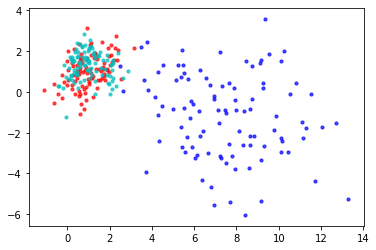

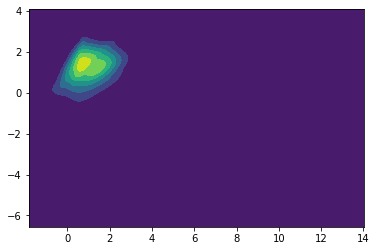

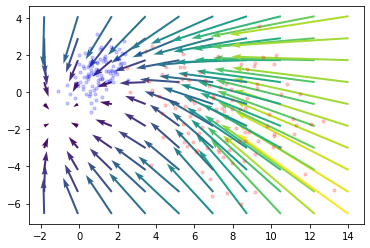

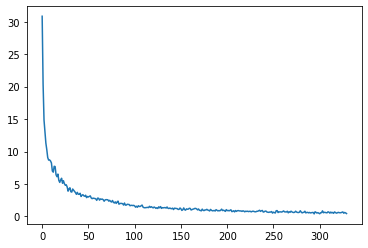

335 0.75096416


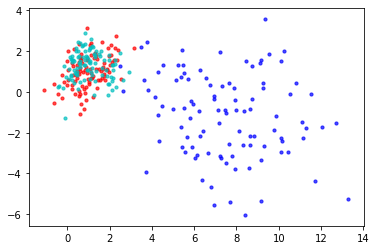

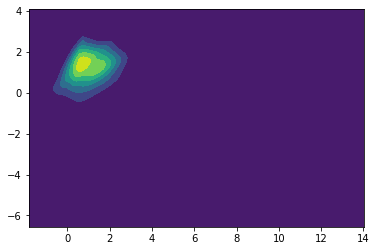

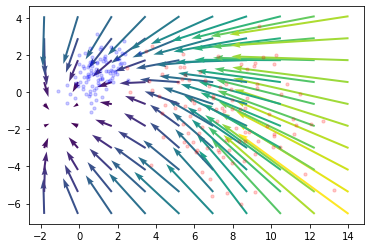

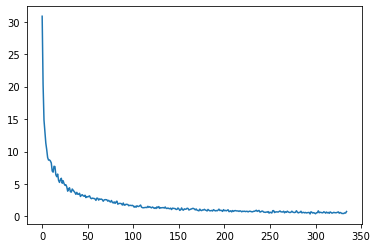

340 0.41179752


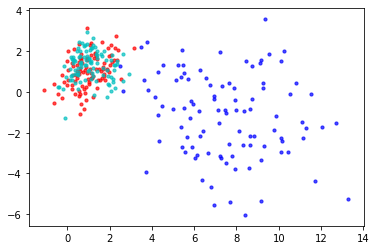

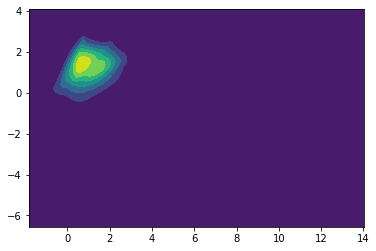

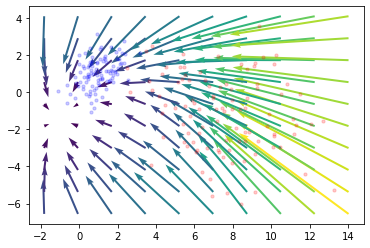

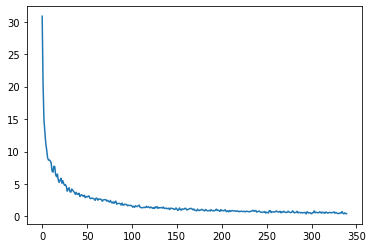

345 0.50669


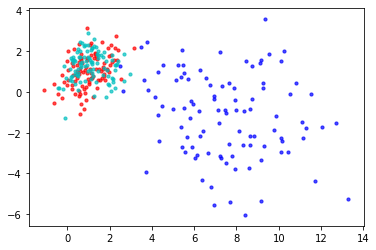

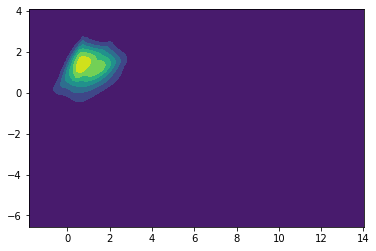

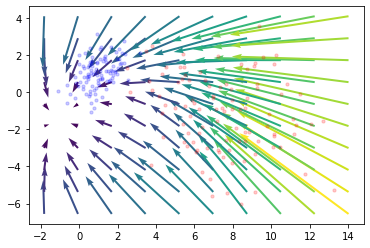

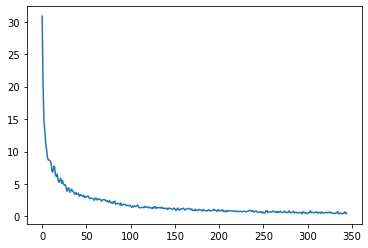

350 0.53786755


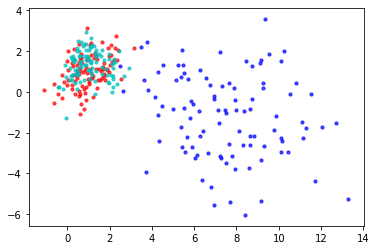

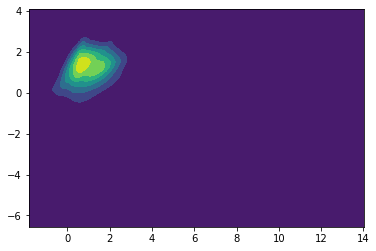

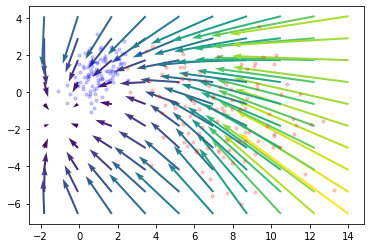

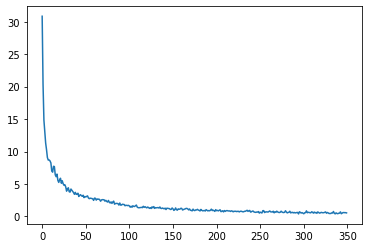

355 0.5304041


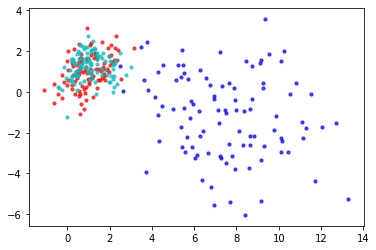

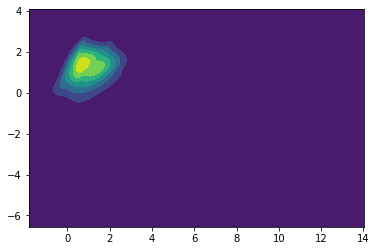

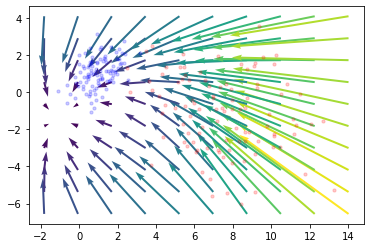

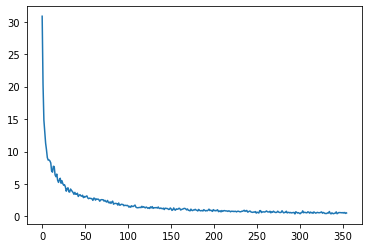

360 0.5310221


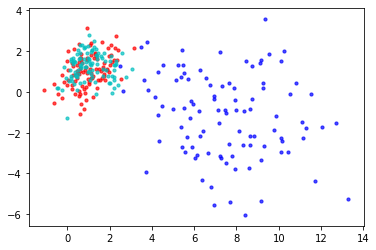

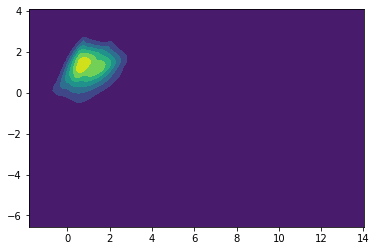

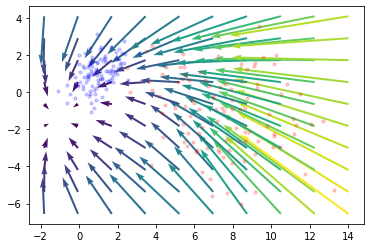

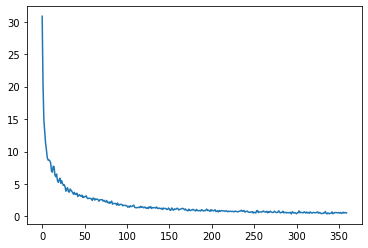

365 0.5452452


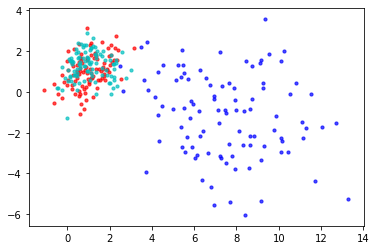

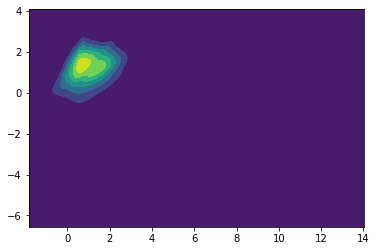

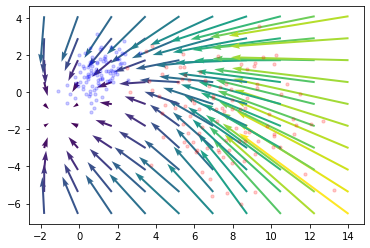

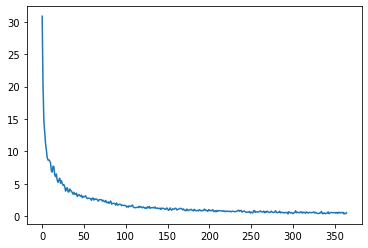

370 0.5668478


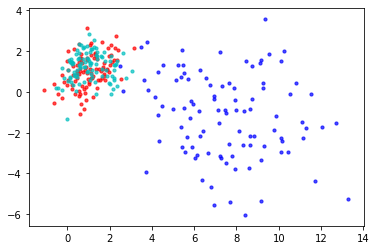

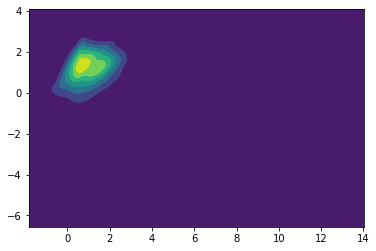

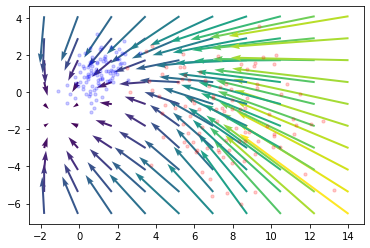

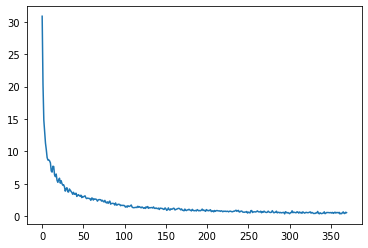

375 0.33988094


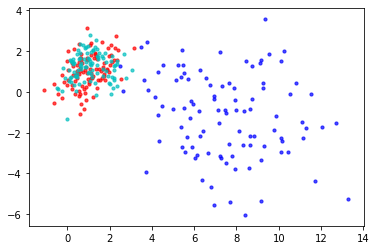

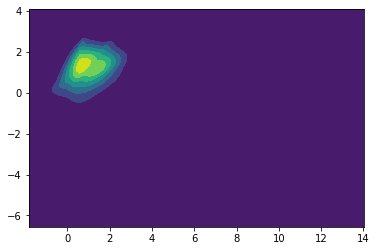

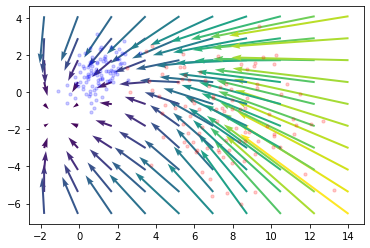

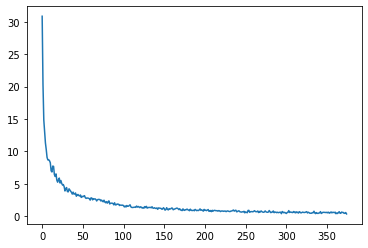

380 0.539649


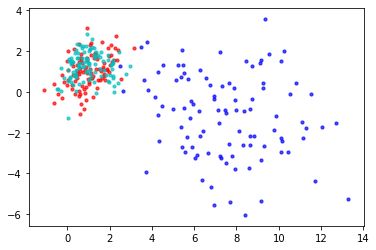

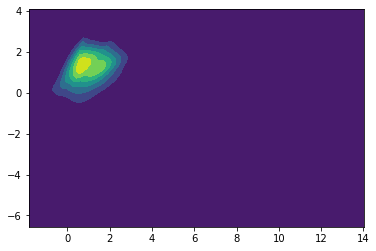

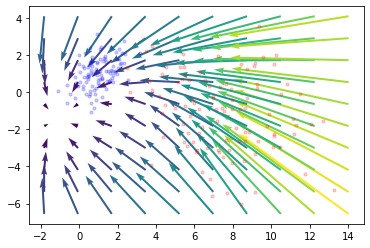

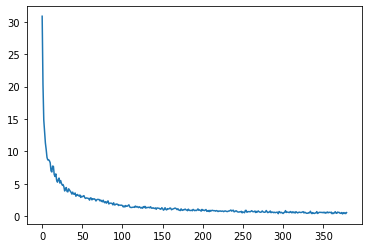

385 0.48247623


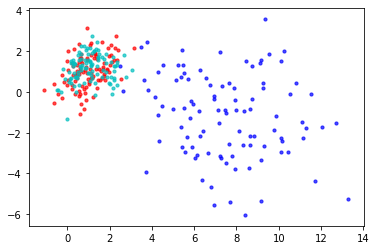

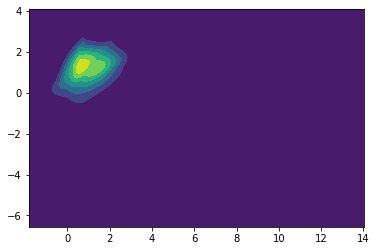

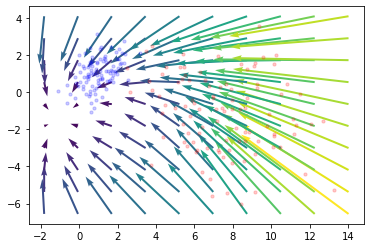

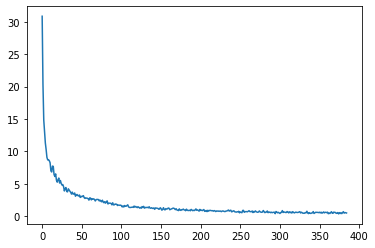

390 0.4115324


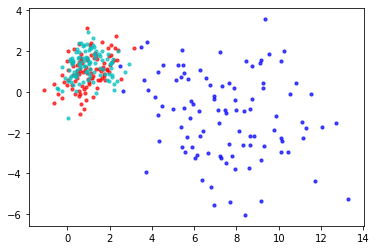

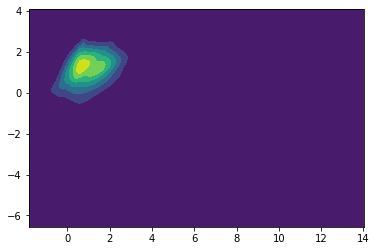

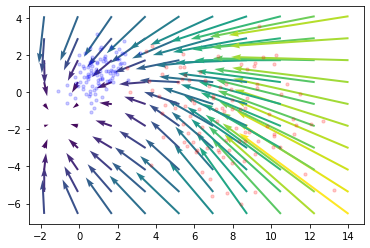

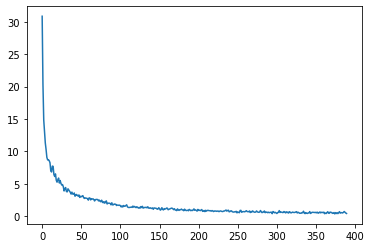

395 0.4975462


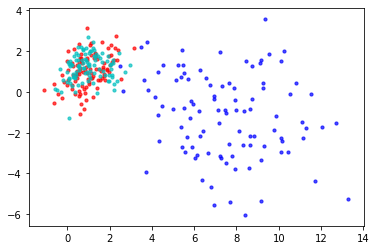

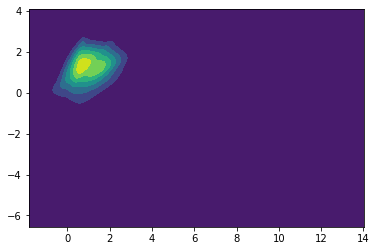

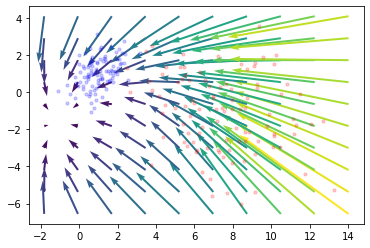

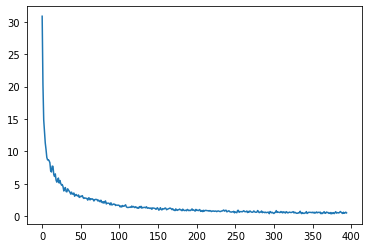

400 0.71306705


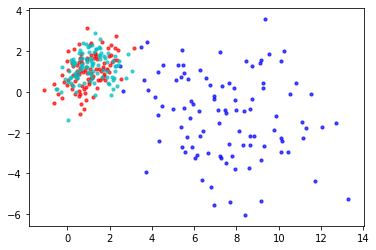

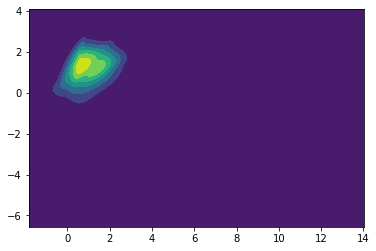

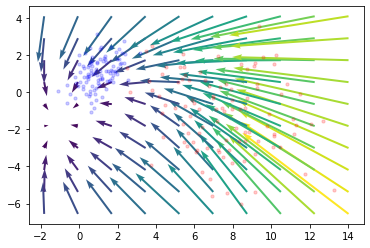

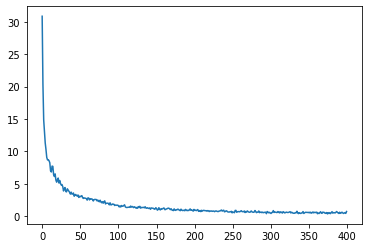

405 0.44542217


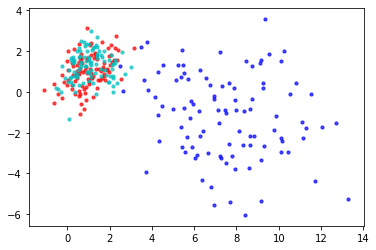

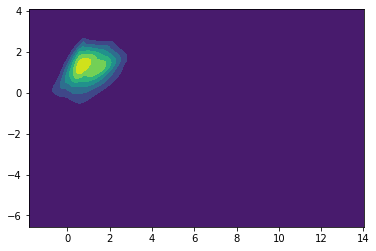

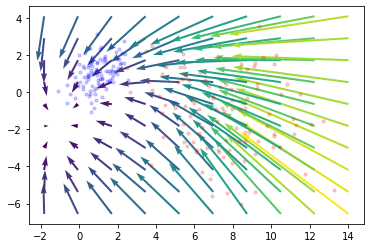

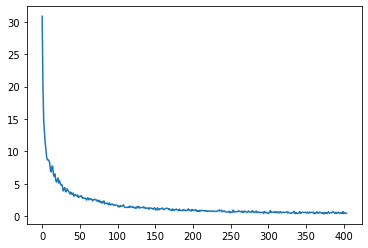

410 0.49395275


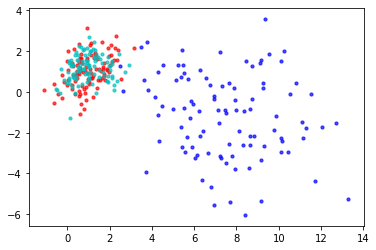

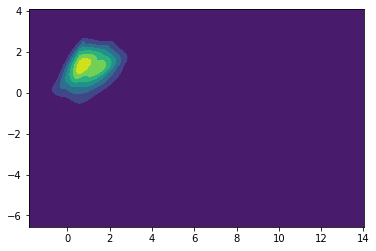

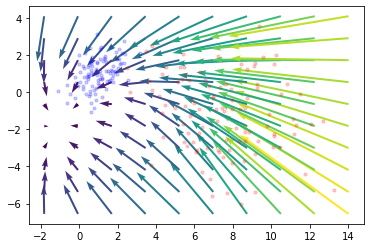

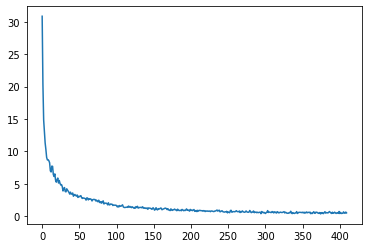

415 0.4241705


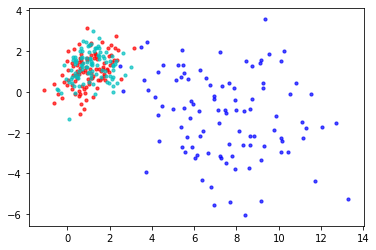

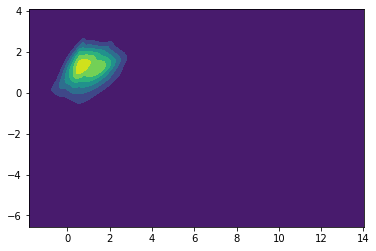

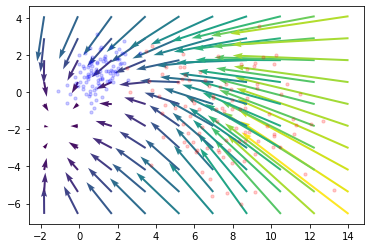

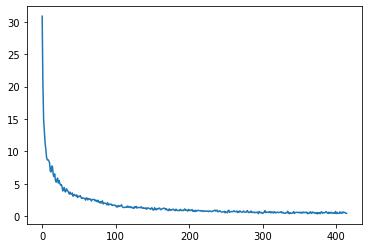

420 0.4247446


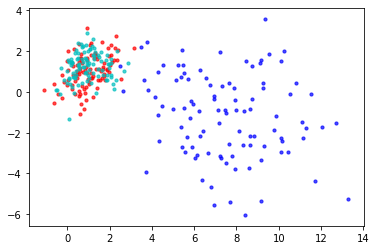

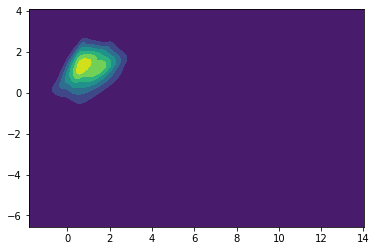

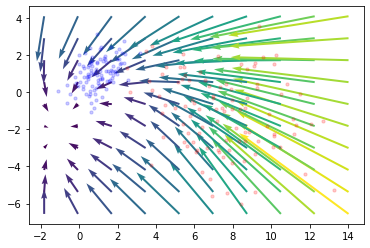

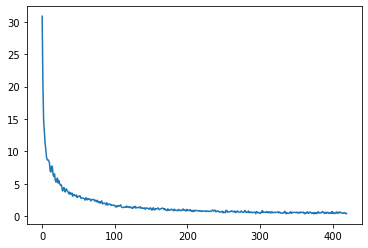

425 0.46481228


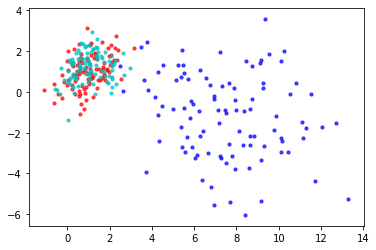

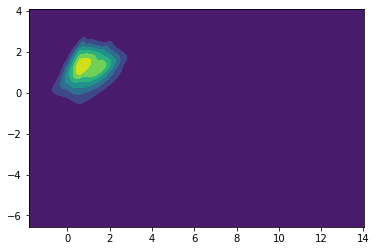

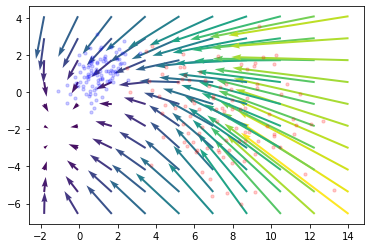

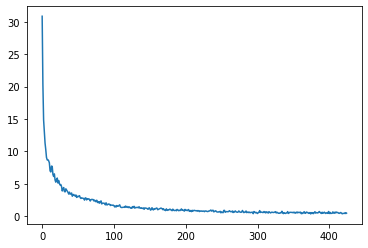

430 0.4979372


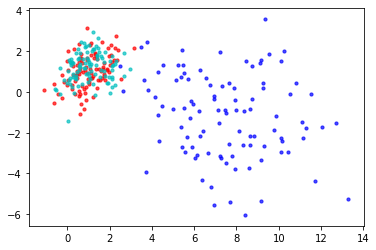

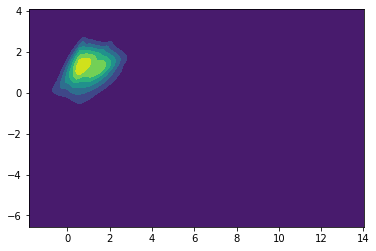

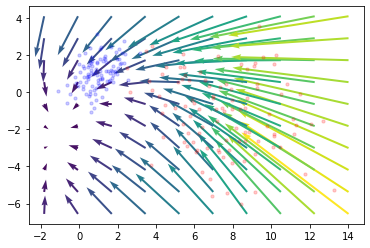

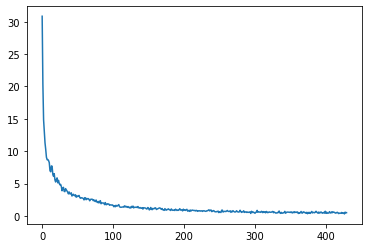

435 0.46176434


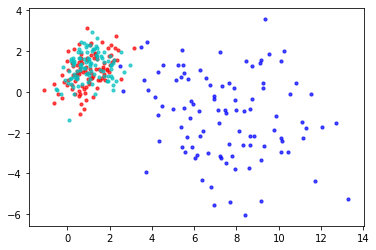

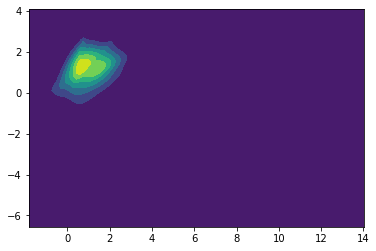

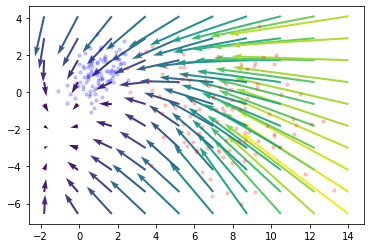

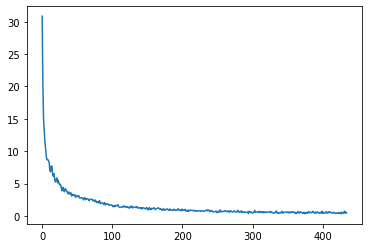

440 0.42265606


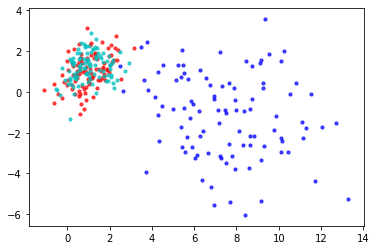

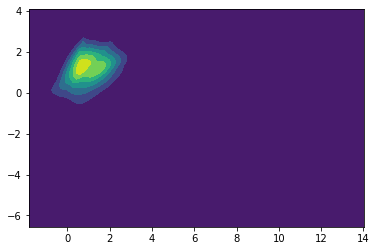

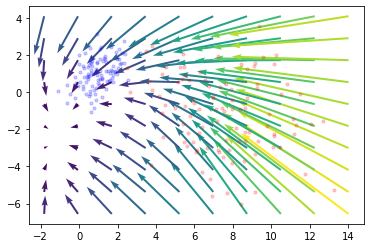

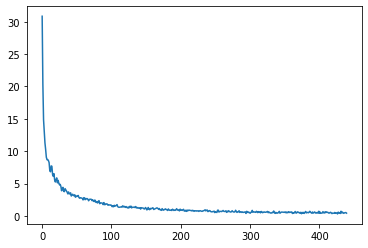

445 0.48649693


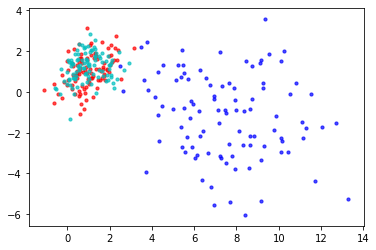

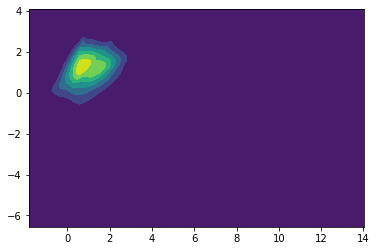

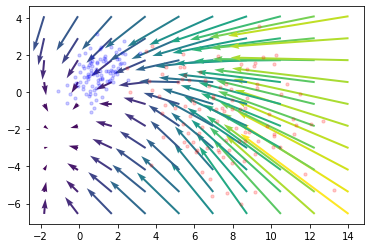

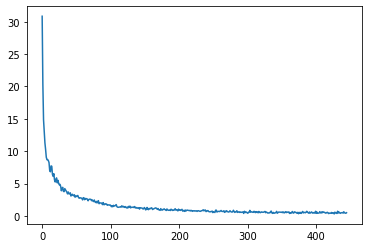

450 0.5380354


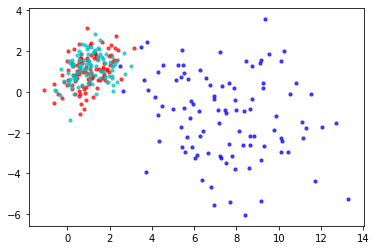

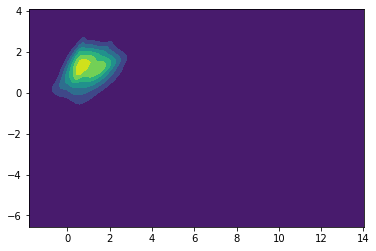

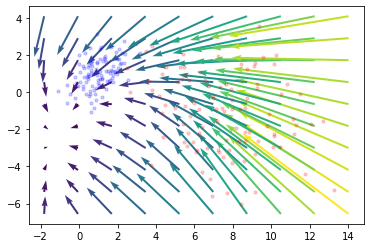

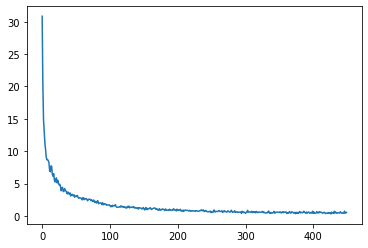

455 0.47794247


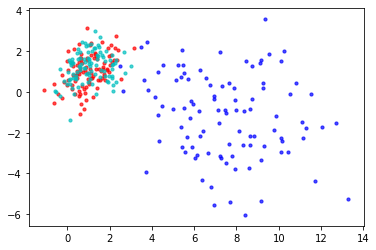

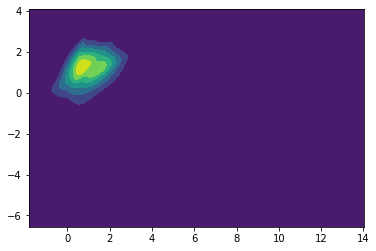

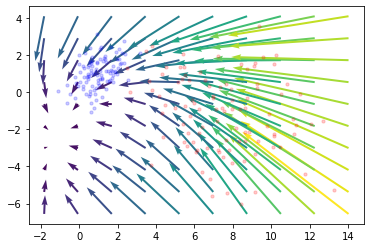

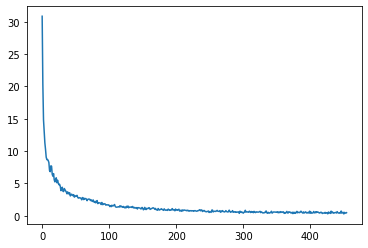

460 0.32992268


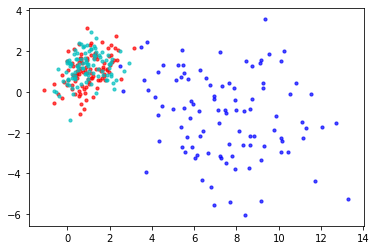

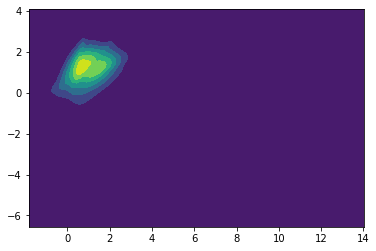

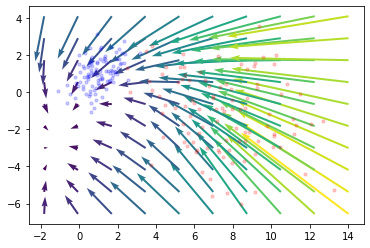

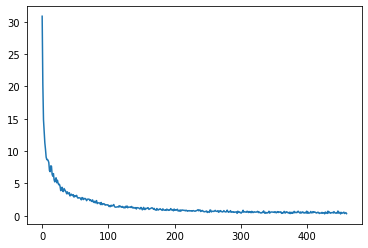

465 0.6462126


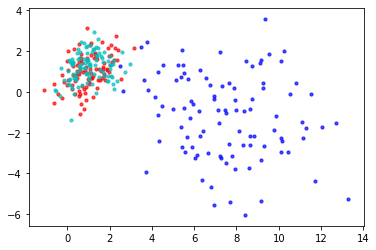

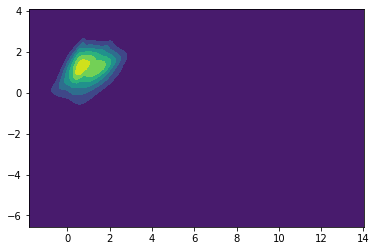

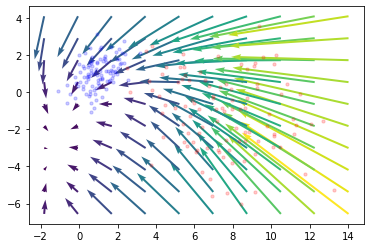

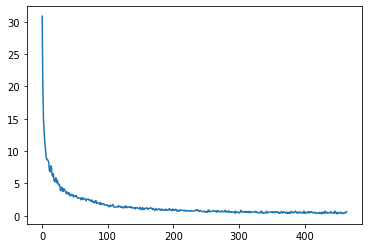

470 0.36214733


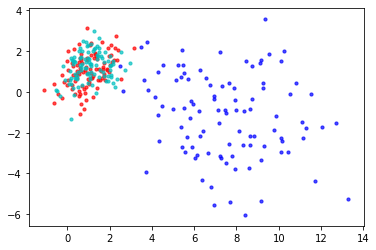

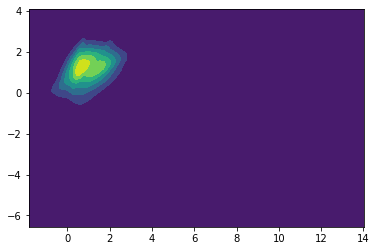

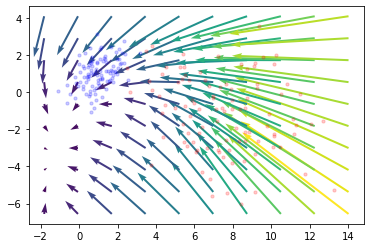

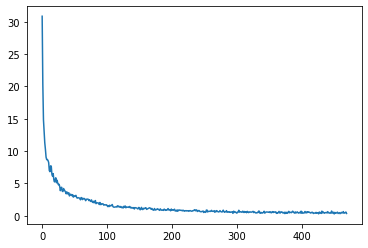

475 0.39166546


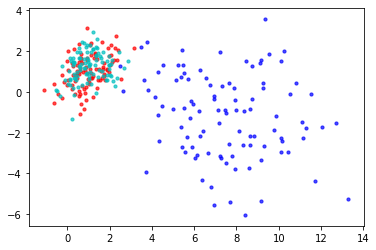

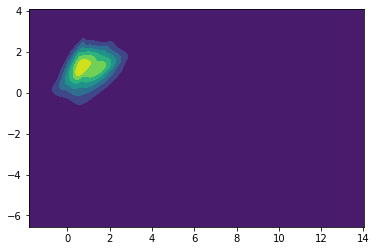

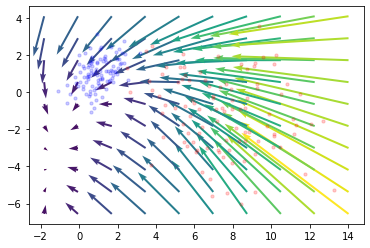

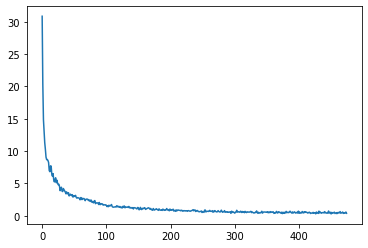

480 0.4469347


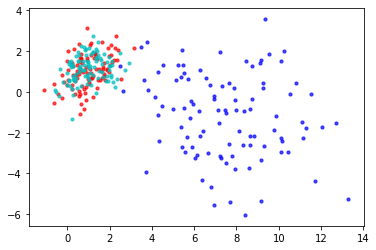

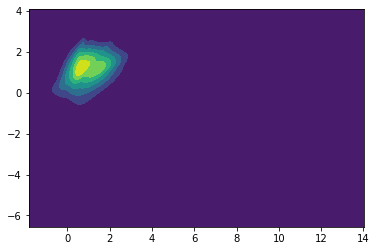

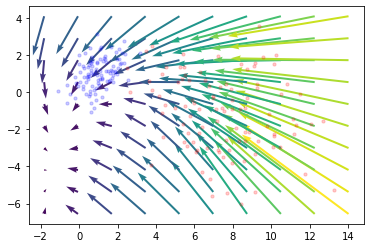

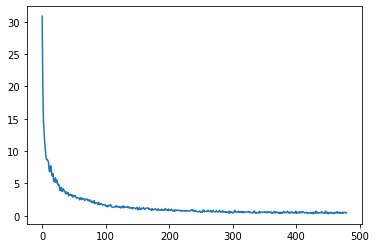

485 0.3994398


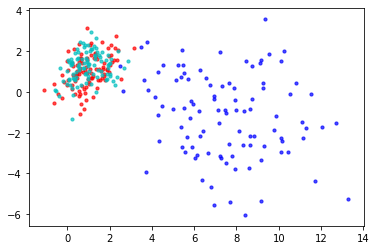

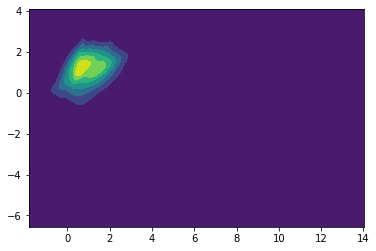

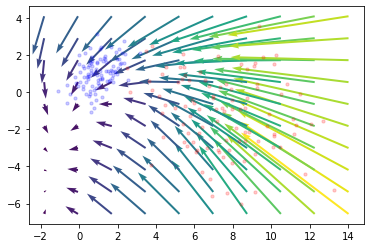

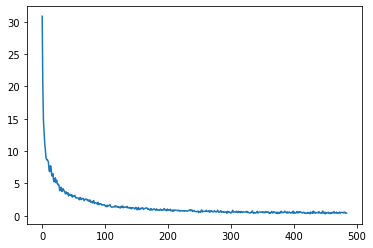

490 0.50635815


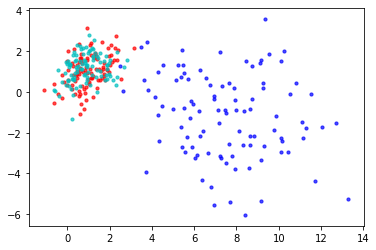

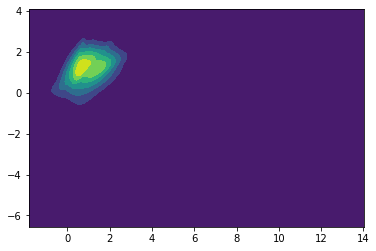

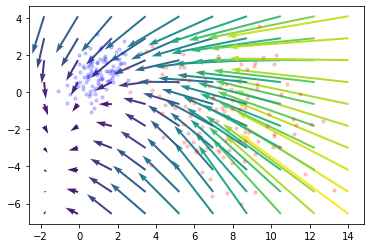

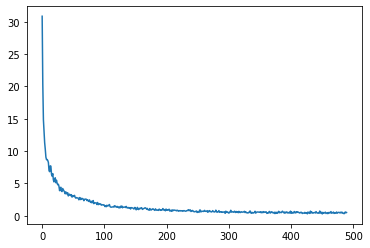

495 0.52655506


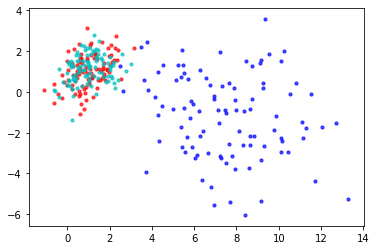

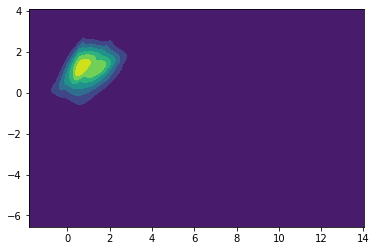

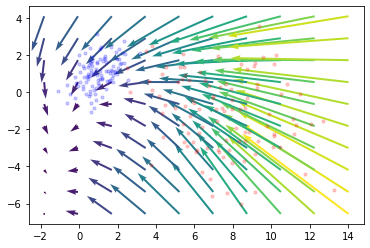

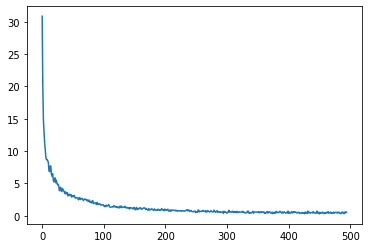

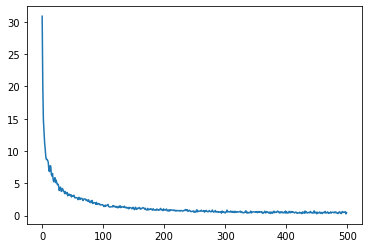

In [ ]:
from jax.experimental import optimizers

opt_init, opt_update, get_params = optimizers.momentum(step_size=1e-5, mass=0.9)
opt_init, opt_update, get_params = optimizers.adam(1e-4)

@jax.jit
def step(i, opt_state, rng):
  params = get_params(opt_state)
  val, g = jax.value_and_grad(loss)(params, rng)
  return val, opt_update(i, g, opt_state)

init_thetas = (init_nvp_chain(4)[0], init_nvp_chain(4)[0])
opt_state = opt_init(init_thetas)
nvp_gen_fn = nvp_fns[2]

losses = []
positions = []

def plot_data(data, color):
  plt.scatter(*data.T, s=10, c=color, alpha=0.7)


loss_value = None
for i in range(500):
  rng = jax.random.PRNGKey(i)
  if i % 5 == 0:
    cur_theta = get_params(opt_state)
    print(i, loss_value)
    theta_ab, theta_t = cur_theta
    transformed_b = nvp_gen_fn(data_b, theta_t)
    positions.append(transformed_b)
    plot_data(data_a, 'r')
    plot_data(data_b, 'b')
    plot_data(transformed_b, 'c')
    plt.show()

    plot_theta(theta_ab, '', xlim, ylim)
    plt.show()

    quiver_flow(theta_t, scale=40, lims=(xlim, ylim))
    plt.scatter(*data_a.T, s=10, color='blue', alpha=0.2)
    plt.scatter(*data_b.T, s=10, color='red', alpha=0.2)
    plt.show()
    plt.show()

    plt.plot(losses)
    plt.show()

  loss_value, opt_state = step(i, opt_state, rng)
  losses.append(loss_value)

plt.plot(losses)
plt.show()